![ApplAi's Logo](https://media-exp1.licdn.com/dms/image/C4E0BAQHGLGltI2rzuQ/company-logo_200_200/0?e=2159024400&v=beta&t=adq8rNV09dPC6egdJMnfARt6Aq0TC9bSomFvFtm50WM)

# Project Outline

### Task 1: Understand and learn the dataset.
### Task 2: Clean the Data as best as possible.
### Task 3: Analyze Extremely and Visualize your insights.
### Task 4: Build Machine Learning models to cluster customers.
### Task 5: After clustering, analyze why each sample in the same cluster is alike, and how is each cluster different from the other clusters.
### Bonus: Feature Selection and Engineering, Use Plotly for visualizations.

# Team 6:

* Nour Madkour
* Nour Sameh
* Ali AbdelHady
* Mohamed Mostafa

# Importing libraries and Reading Data

In [5]:
import pandas as pd
import numpy as np

#visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# check if the data normally distributed
from scipy.stats import shapiro, boxcox
from sklearn.preprocessing import PowerTransformer
import statsmodels.api as sm

# Data analysis libraries
from scipy import stats
from scipy.stats import norm

# Preprocessing
from sklearn.preprocessing import RobustScaler
from sklearn import preprocessing

# Feature Reducing
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
# import umap.umap_ as umap
from umap.umap_ import UMAP
import umap

# K-means model
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

#DB-scan model
from sklearn.cluster import DBSCAN

# stacking ensamble
from sklearn.base import BaseEstimator, ClusterMixin
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Set up the matplotlib backend for inline plotting
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
import matplotlib.patches as mpatches
import time

In [6]:
df = pd.read_csv('bank.csv')

##Data Description
 * **age:** Age of the individual.
 * **job:** Occupation or job of the individual.
 * **marital:** Marital status of the individual.
 * **education:** Level of education attained by the individual.
 * **default:** Whether the individual has credit in default or not.
 * **balance:** Balance in the individual's bank account.
 * **housing:** Whether the individual has a housing loan or not.
 * **loan:** Whether the individual has a personal loan or not.
 * **contact:** Type of communication contact.
 * **day:** Day of the month when the contact was made.
 * **month:** Month of the year when the contact was made.
 * **duration:**last contact duration, in seconds (numeric).This input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
 * **campaign:** Number of contacts performed during this campaign for this individual.
 * **pdays:** Number of days that passed by after the client was last contacted from a previous campaign.
 * **previous:** Number of contacts performed before this campaign for this individual.
 * **poutcome:** Outcome of the previous marketing campaign.
 * **deposit**: Whether the individual has subscribed to a term deposit or not

# Task 1: Understanding the dataset and EDA

In [7]:
df.shape

(11162, 17)

* Dataset consists of **```11162 rows```** and **```17 columns```**.

In [8]:
df.head(20).style.background_gradient('Blues')

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes
5,42,management,single,tertiary,no,0,yes,yes,unknown,5,may,562,2,-1,0,unknown,yes
6,56,management,married,tertiary,no,830,yes,yes,unknown,6,may,1201,1,-1,0,unknown,yes
7,60,retired,divorced,secondary,no,545,yes,no,unknown,6,may,1030,1,-1,0,unknown,yes
8,37,technician,married,secondary,no,1,yes,no,unknown,6,may,608,1,-1,0,unknown,yes
9,28,services,single,secondary,no,5090,yes,no,unknown,6,may,1297,3,-1,0,unknown,yes


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11162 non-null  int64 
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(7), object(10)
memory usage: 1.4+ MB


We concluded that

*   job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'poutcome', 'deposit' need to be encoded
*   no null values but there might be unknown values



In [10]:
cat_columns = df.select_dtypes(include='object').columns
num_columns = df.select_dtypes(include='int64').columns
cat_columns

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'poutcome', 'deposit'],
      dtype='object')

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,11162.0,41.231948,11.913369,18.0,32.0,39.0,49.00,95.0
balance,11162.0,1528.538524,3225.413326,-6847.0,122.0,550.0,1708.00,81204.0
day,11162.0,15.658036,8.420740,1.0,8.0,15.0,22.00,31.0
duration,11162.0,371.993818,347.128386,2.0,138.0,255.0,496.00,3881.0
campaign,11162.0,2.508421,2.722077,1.0,1.0,2.0,3.00,63.0
pdays,11162.0,51.330407,108.758282,-1.0,-1.0,-1.0,20.75,854.0
previous,11162.0,0.832557,2.292007,0.0,0.0,0.0,1.00,58.0


*   **age** : mean age is 41 min is 18 , max 95
* The majority of individuals fall within the range of 32 to 49 years, with the median age (50th percentile) being 39 years.

*   **balance** : On average, individuals in the dataset report 1528.538524 min -6847 (money they have to give bank ,std is 3225.413326	suggests that there is a considerable variation or dispersion in the balances across the dataset.)


*  **day** : range from 1-31
* The median value of 15.0 suggests that half of the contacts were made before the 15th day of the month and half were made after
* On average, contacts were made around the 16th day of the month

*  **duration** :min 2 sec ,max 3881 which is 1 hr 4 minutes

* **pdays** :	The average number of days since the last contact is approximately 51.33 days.
* The std indicates the variability in the number of days.
* The minimum value of -1.0 represent cases where the client was never contacted before
* The median value of 20.75 suggests that half of the clients were last contacted within approximately 20.75 days.
* **previous** : The standard deviation indicates the variability in the number of previous contacts.
* min value 0.0 suggests that some individuals had no contacts before this campaign.
* max value of 58.0 indicates the highest number of contacts performed before this campaign.
* The median value of 1.00 suggests that half of the individuals had 1 or fewer previous contacts before this campaign.


In [12]:
df.duplicated().sum()

0

In [13]:
df.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
deposit      0
dtype: int64

In [14]:
df.describe(include='O').T

,count,unique,top,freq
job,11162,12,management,2566
marital,11162,3,married,6351
education,11162,4,secondary,5476
default,11162,2,no,10994
housing,11162,2,no,5881
loan,11162,2,no,9702
contact,11162,3,cellular,8042
month,11162,12,may,2824
poutcome,11162,4,unknown,8326
deposit,11162,2,no,5873


### categorical and numerical values

In [15]:
categ_cols = df.select_dtypes(include='object').columns.tolist()
num_cols = df.select_dtypes(include='int64').columns.tolist()

In [16]:
for column in categ_cols:
    print(f"{column}'s Unique values: {df[column].unique()}")
    print("-------------\n")

job's Unique values: ['admin.' 'technician' 'services' 'management' 'retired' 'blue-collar'
 'unemployed' 'entrepreneur' 'housemaid' 'unknown' 'self-employed'
 'student']
-------------

marital's Unique values: ['married' 'single' 'divorced']
-------------

education's Unique values: ['secondary' 'tertiary' 'primary' 'unknown']
-------------

default's Unique values: ['no' 'yes']
-------------

housing's Unique values: ['yes' 'no']
-------------

loan's Unique values: ['no' 'yes']
-------------

contact's Unique values: ['unknown' 'cellular' 'telephone']
-------------

month's Unique values: ['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'jan' 'feb' 'mar' 'apr' 'sep']
-------------

poutcome's Unique values: ['unknown' 'other' 'failure' 'success']
-------------

deposit's Unique values: ['yes' 'no']
-------------



In [17]:
for column in num_cols:
    print(f"{column} Unique : {df[column].unique()}")
    print("-------------\n")

age Unique : [59 56 41 55 54 42 60 37 28 38 30 29 46 31 35 32 49 43 26 40 33 23 48 45
 36 52 53 39 57 51 44 24 50 27 34 47 25 58 61 68 75 22 69 66 85 72 90 67
 71 21 74 65 62 83 70 76 77 19 73 63 20 78 95 64 79 82 18 86 84 87 92 81
 80 93 88 89]
-------------

balance Unique : [2343   45 1270 ... 1594 2593 -134]
-------------

day Unique : [ 5  6  7  8  9 12 13 14 15 16 19 20 21 23 26 27 28 29 30  2  3  4 11 17
 18 24  1 10 22 25 31]
-------------

duration Unique : [1042 1467 1389 ... 1504  818 1812]
-------------

campaign Unique : [ 1  2  3  4  6  5  8 11  9 10 15 12 14  7 24 13 17 29 21 20 16 32 19 25
 22 43 18 41 63 27 30 26 23 28 33 31]
-------------

pdays Unique : [ -1 166  91 147 170 150 171 126 182 110 198 174 175  27 128 100 177 167
 122 183 195 133 178  34  10 163 184 154  99  93   2 242 272  76 160  90
 196 246 238 203 268 189 267  92   9  88  85 210 257 261 270 106 199 112
  41 294 231 239 302 135 307 222 138 323 141 320 264 316 315 256 146 328
  74 148 327 341 145 266 23

### unknown

In [18]:
for column in categ_cols:
    print(f"Number of 'unknown' values in {column}: {(df[column] == 'unknown').sum()}\n")

Number of 'unknown' values in job: 70

Number of 'unknown' values in marital: 0

Number of 'unknown' values in education: 497

Number of 'unknown' values in default: 0

Number of 'unknown' values in housing: 0

Number of 'unknown' values in loan: 0

Number of 'unknown' values in contact: 2346

Number of 'unknown' values in month: 0

Number of 'unknown' values in poutcome: 8326

Number of 'unknown' values in deposit: 0



In [19]:
# Count rows where all specified columns are unknown
count_unknown_rows = df[(df['job'] == 'unknown') &
                        (df['education'] == 'unknown') &
                        (df['poutcome'] == 'unknown') &
                        (df['contact'] == 'unknown')&
                        (df['pdays'] == -1)].shape[0]

print("Number of rows with all specified columns unknown:", count_unknown_rows)

Number of rows with all specified columns unknown: 6


In [20]:
df = df[~((df['job'] == 'unknown') &
          (df['education'] == 'unknown') &
          (df['poutcome'] == 'unknown') &
          (df['contact'] == 'unknown') &
          (df['pdays'] == -1))]

In [21]:
columns_with_unknown = [column for column in categ_cols if (df[column] == 'unknown').any()]

In [22]:
columns_with_unknown

['job', 'education', 'contact', 'poutcome']

we will plot the relations of ['education', 'contact', 'poutcome','job']

### Age

In [23]:
df['age'].value_counts()

age
31    496
32    477
34    466
33    464
35    461
     ... 
92      2
93      2
88      2
95      1
89      1
Name: count, Length: 76, dtype: int64

<Axes: xlabel='age', ylabel='Count'>

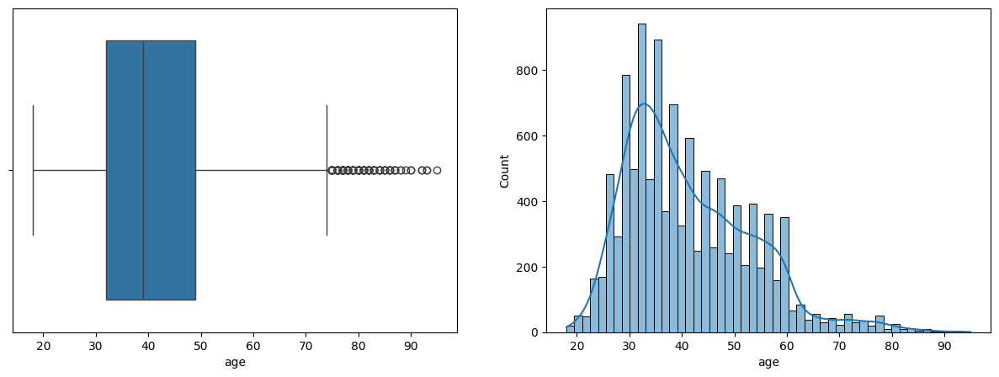

In [24]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(x = df['age'])
plt.subplot(1,2,2)
sns.histplot(x = df['age'], kde=True)

data in column age is right skewed and there are outliers

### job

In [25]:
# fig=px.bar(df.job.value_counts().reset_index().rename(columns={'index':'Job','job':'Count'}),x='Job',y='Count',color='Job',text='Count')
# fig.update_traces(marker=dict(line=dict(color='#000000', width=1.2)))
# fig.update_layout(title_x=0.5,title_text='<b>Job type of the Customers',font_family="Times New Roman",title_font_family="Times New Roman")

In [26]:
df['job'].value_counts()

job
management       2566
blue-collar      1944
technician       1823
admin.           1334
services          923
retired           778
self-employed     405
student           360
unemployed        357
entrepreneur      328
housemaid         274
unknown            64
Name: count, dtype: int64

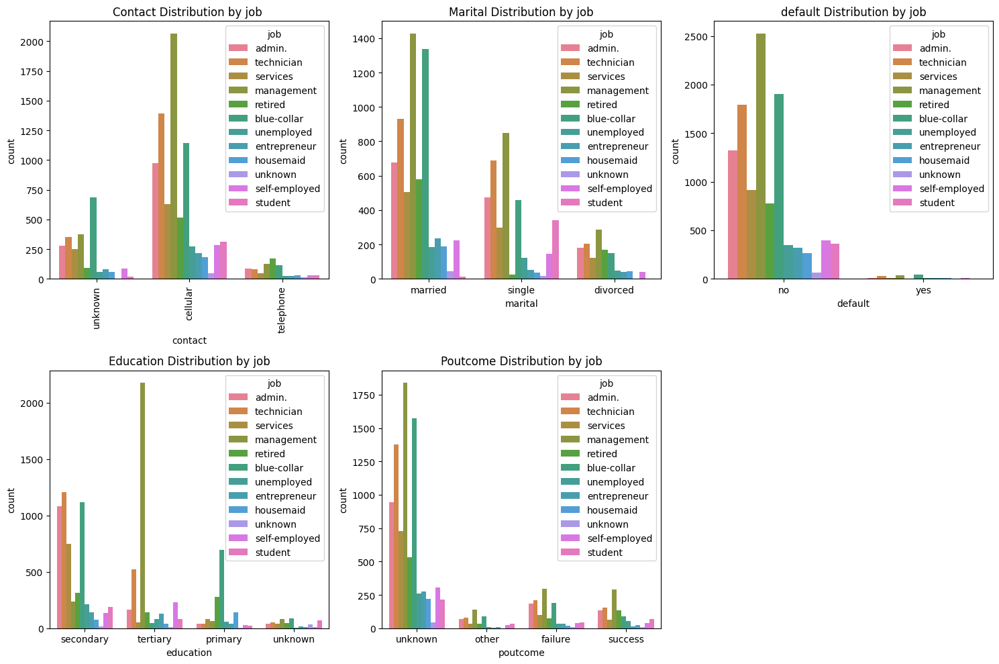

In [27]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

# Plot count plots for each feature grouped by 'job'
sns.countplot(x='contact', hue='job', data=df, ax=axes[0, 0])
axes[0, 0].set_title('Contact Distribution by job ')
axes[0, 0].set_xticklabels(axes[0, 0].get_xticklabels(), rotation=90)

sns.countplot(x='marital', hue='job', data=df, ax=axes[0, 1])
axes[0, 1].set_title('Marital Distribution by job')

sns.countplot(x='default', hue ='job',data = df , ax=axes[0,2])
axes[0, 2].set_title('default Distribution by job')

sns.countplot(x='education', hue='job', data=df, ax=axes[1, 0])
axes[1, 0].set_title('Education Distribution by job')

sns.countplot(x='poutcome', hue='job', data=df, ax=axes[1, 1])
axes[1, 1].set_title('Poutcome Distribution by job')

fig.delaxes(axes[1, 2])

plt.tight_layout()
plt.show()

most of the unknown in job  are :
* cellullar in (contact)
*  marrid(Marital)
* no in (default)
* secondary edu(education)
* unknown also in (poutcome)
                        

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 [Text(0, 0, 'admin.'),
  Text(1, 0, 'technician'),
  Text(2, 0, 'services'),
  Text(3, 0, 'management'),
  Text(4, 0, 'retired'),
  Text(5, 0, 'blue-collar'),
  Text(6, 0, 'unemployed'),
  Text(7, 0, 'entrepreneur'),
  Text(8, 0, 'housemaid'),
  Text(9, 0, 'unknown'),
  Text(10, 0, 'self-employed'),
  Text(11, 0, 'student')])

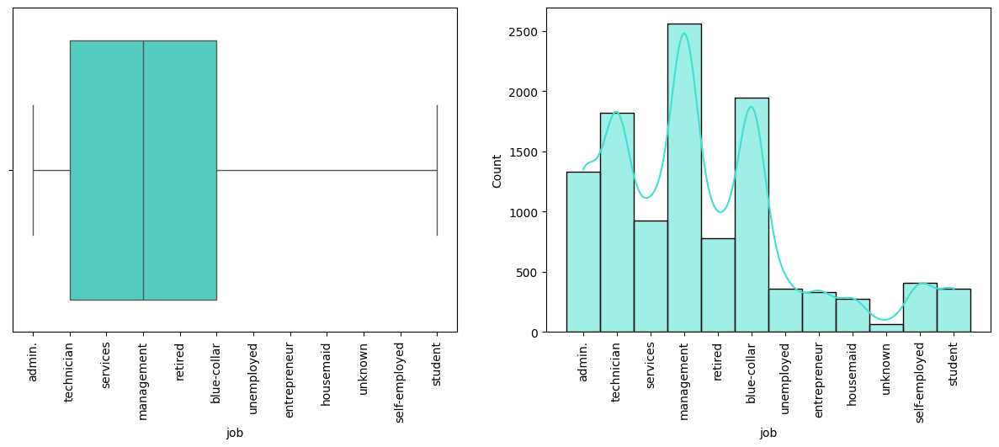

In [28]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(x = df['job'],color='turquoise')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
sns.histplot(x = df['job'], kde=True,color='turquoise')
plt.xticks(rotation=90)

In [29]:
unknown_jobs_df = df[df['job'] == 'unknown']
print(unknown_jobs_df)


       age      job  marital  education default  balance housing loan  \
66      49  unknown  married    primary      no      341     yes  yes   
668     52  unknown  married    unknown      no     5361      no   no   
861     60  unknown  married    unknown      no    17297      no   no   
1075    31  unknown  married  secondary      no      111      no   no   
1091    34  unknown   single  secondary      no      859      no   no   
...    ...      ...      ...        ...     ...      ...     ...  ...   
9845    36  unknown  married  secondary      no      179      no   no   
9976    43  unknown  married    primary      no        0     yes   no   
10570   77  unknown  married    unknown      no      397      no   no   
10660   54  unknown  married    unknown      no      390      no   no   
10805   51  unknown  married    unknown      no     2642      no   no   

         contact  day month  duration  campaign  pdays  previous poutcome  \
66       unknown   15   may       520         

no outliers so fill unknown with mode

### marital

In [30]:
fig = px.pie(df, names='marital', title='marital Status Distribution',
             labels={'marital': 'marital'},
             color='marital',
            color_discrete_sequence=px.colors.qualitative.Pastel)

fig.show()

In [31]:
marital_Status = df.groupby('marital')['balance'].mean().reset_index()
marital_Status

,marital,balance
0,divorced,1372.876161
1,married,1596.979991
2,single,1457.652260


### education

In [32]:
df['education'].value_counts()

education
secondary    5476
tertiary     3689
primary      1500
unknown       491
Name: count, dtype: int64

"education" column, since the number of unknown values (491) is relatively small compared to the total number of data points (approximately 11,162) and the outliers are in unkown category

<Axes: xlabel='education', ylabel='count'>

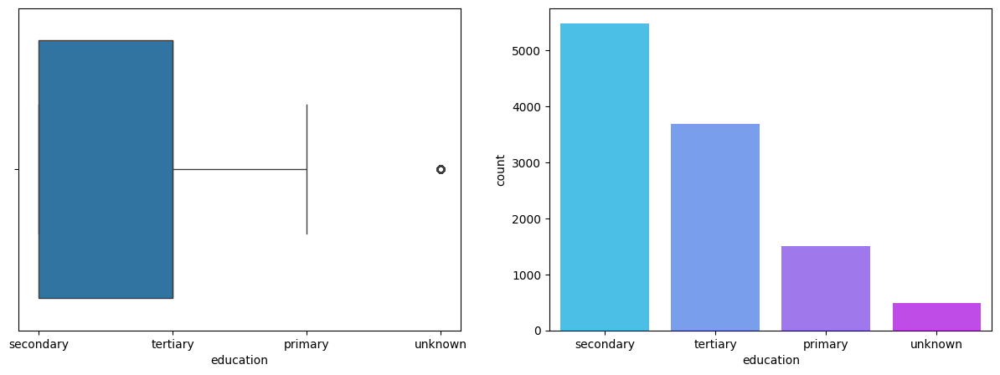

In [33]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(x = df['education'])
plt.subplot(1,2,2)
sns.countplot(x ='education',data=df,palette='cool')

In [34]:
# Find the mode (most frequent category) of the 'education' column
mode_education = df['education'].mode()[0]

# Replace 'unknown' values with the mode
df['education'].replace('unknown', mode_education, inplace=True)

### contact

In [35]:
df['contact'].value_counts()/df['contact'].shape[0]*100

contact
cellular     72.086769
unknown      20.975260
telephone     6.937971
Name: count, dtype: float64

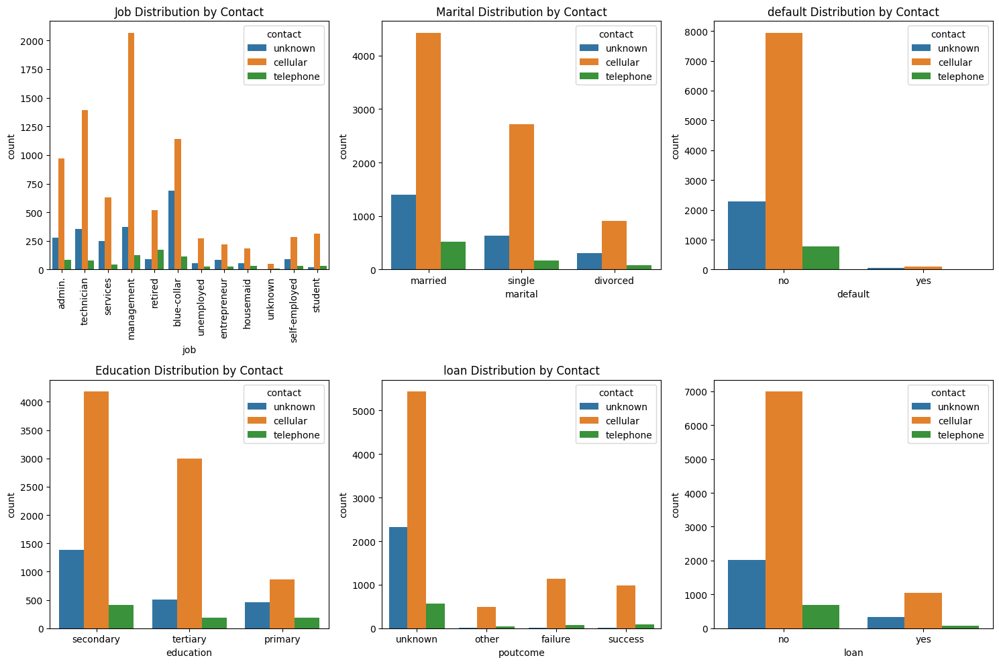

In [36]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

# Plot count plots for each feature grouped by 'contact'
sns.countplot(x='job', hue='contact', data=df, ax=axes[0, 0])
axes[0, 0].set_title('Job Distribution by Contact')
axes[0, 0].set_xticklabels(axes[0, 0].get_xticklabels(), rotation=90)

sns.countplot(x='marital', hue='contact', data=df, ax=axes[0, 1])
axes[0, 1].set_title('Marital Distribution by Contact')

sns.countplot(x='default', hue ='contact',data = df , ax=axes[0,2])
axes[0, 2].set_title('default Distribution by Contact')

sns.countplot(x='education', hue='contact', data=df, ax=axes[1, 0])
axes[1, 0].set_title('Education Distribution by Contact')

sns.countplot(x='poutcome', hue='contact', data=df, ax=axes[1, 1])
axes[1, 1].set_title('Poutcome Distribution by Contact')

sns.countplot(x='loan', hue='contact', data=df, ax=axes[1, 2])
axes[1, 1].set_title('loan Distribution by Contact')


plt.tight_layout()
plt.show()

<Axes: xlabel='contact', ylabel='Count'>

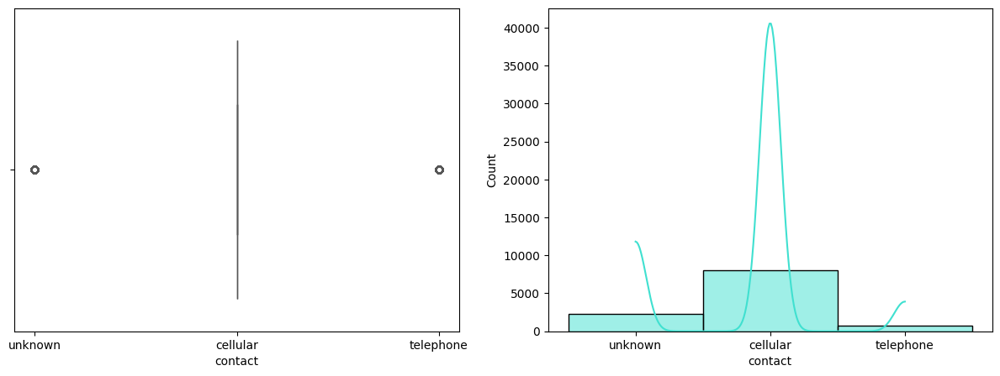

In [37]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(x = df['contact'],color='turquoise')
plt.subplot(1,2,2)
sns.histplot(x = df['contact'], kde=True,color='turquoise')

Since 'cellular' is the dominant category, we might consider replacing the unknown values with 'cellular', assuming that these records were contacted via cellular communication but the mode of contact was not recorded

most of the unknown in contact  are :
*  blue coller (job)
*  marrid(Marital)
* no in (default)
* secondary edu(education)
* unknown also in (poutcome)
* most of ppl that dont have loan are cellular                        

### default

<Axes: xlabel='default', ylabel='count'>

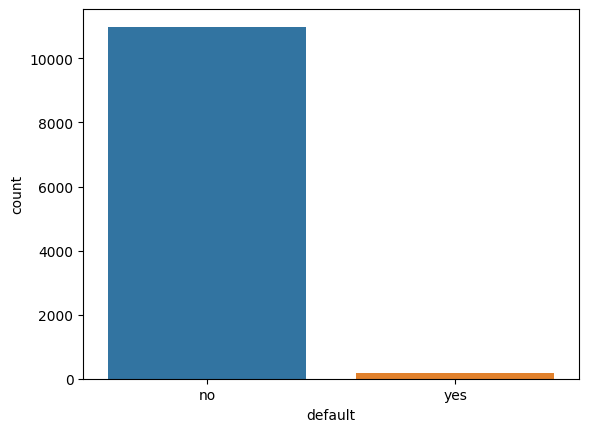

In [38]:
sns.countplot(x='default', hue='default', data=df)

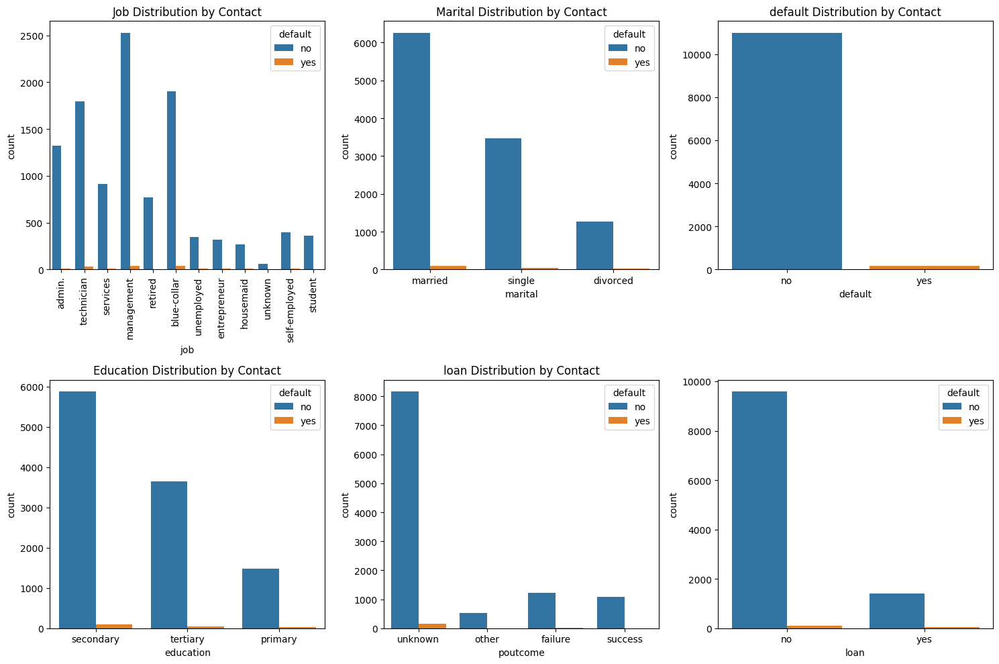

In [39]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

# Plot count plots for each feature grouped by 'default'
sns.countplot(x='job', hue='default', data=df, ax=axes[0, 0])
axes[0, 0].set_title('Job Distribution by Contact')
axes[0, 0].set_xticklabels(axes[0, 0].get_xticklabels(), rotation=90)

sns.countplot(x='marital', hue='default', data=df, ax=axes[0, 1])
axes[0, 1].set_title('Marital Distribution by Contact')

sns.countplot(x='default', hue ='default',data = df , ax=axes[0,2])
axes[0, 2].set_title('default Distribution by Contact')

sns.countplot(x='education', hue='default', data=df, ax=axes[1, 0])
axes[1, 0].set_title('Education Distribution by Contact')

sns.countplot(x='poutcome', hue='default', data=df, ax=axes[1, 1])
axes[1, 1].set_title('Poutcome Distribution by Contact')

sns.countplot(x='loan', hue='default', data=df, ax=axes[1, 2])
axes[1, 1].set_title('loan Distribution by Contact')


plt.tight_layout()
plt.show()

most of the defaulkt is no which is expected as the camain target ppl that dont has credit in default

### balance

In [40]:
df['balance'].value_counts()

balance
 0        774
 1         39
 3         35
 2         34
 4         29
         ... 
 8332       1
 4859       1
-267        1
 12356      1
-134        1
Name: count, Length: 3804, dtype: int64

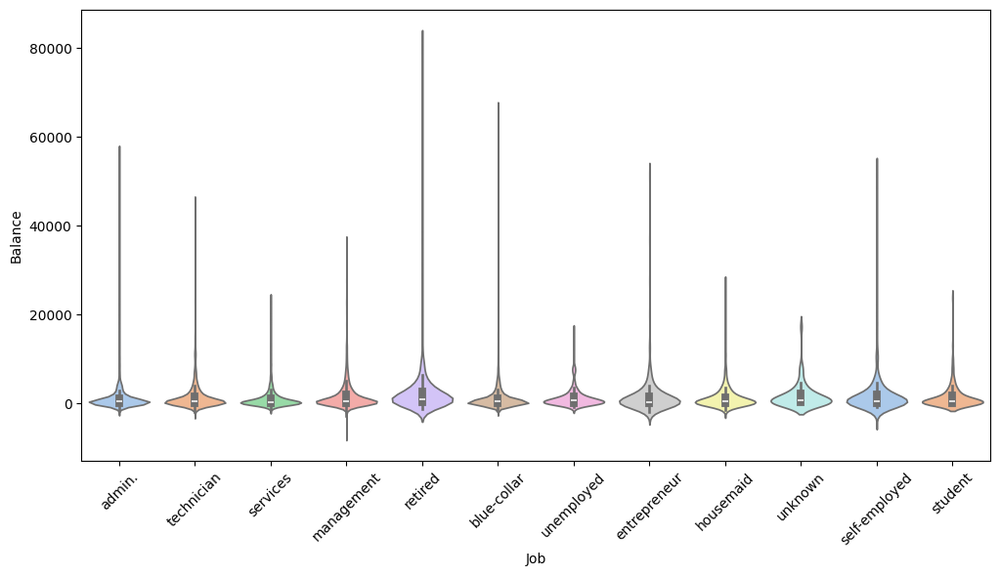

In [41]:
plt.figure(figsize=(12, 6))
sns.violinplot(x='job', y='balance', data=df, palette='pastel')
plt.xlabel('Job')
plt.ylabel('Balance')
plt.xticks(rotation=45)
plt.show()


blue-collar and Retirees are the ones who have the highest balance in their accounts.

<Axes: xlabel='balance', ylabel='Count'>

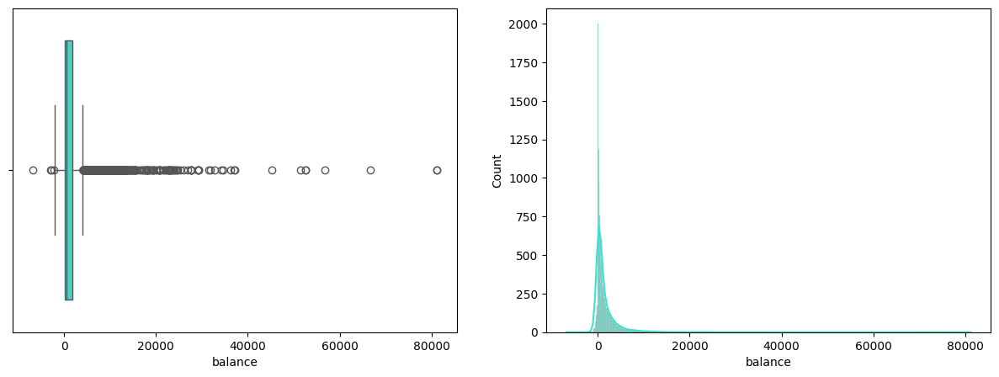

In [42]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(x = df['balance'],color='turquoise')
plt.subplot(1,2,2)
sns.histplot(x = df['balance'], kde=True,color='turquoise')

it seems that their is great outlier in column balance

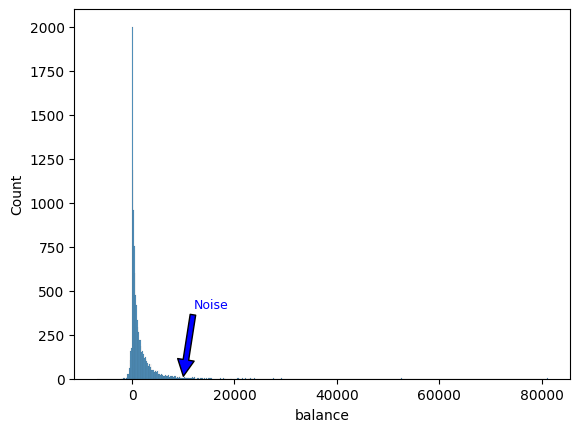

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a histogram of the 'balance' column without KDE
sns.histplot(df['balance'], kde=False)

# Annotate the point indicating noise
plt.annotate('Noise', xy=(10000, 10), xytext=(12000, 400), color='blue', fontsize=9,
             arrowprops=dict(facecolor='blue', shrink=0.01))

# Show the plot
plt.show()


The bank balances are positively skewed, with most clients having less than 10,000  and some having a lot more , most are 0

#### Categorising balance

In [44]:
min_balance = df['balance'].min()
min_balance

-6847

In [45]:
df['balance'].describe()

count    11156.000000
mean      1527.102098
std       3221.830685
min      -6847.000000
25%        122.000000
50%        550.000000
75%       1707.250000
max      81204.000000
Name: balance, dtype: float64

In [46]:
import pandas as pd

# Define bin edges and labels
bin_edges = [-6850, 0, 122, 81204, float('inf')]  # Define the bin edges
bin_labels = ['Negative', 'Low', 'Medium', 'High']  # Define the corresponding labels

# Create a new column 'balance_range' by categorizing 'balance'
df['balance_range'] = pd.cut(df['balance'], bins=bin_edges, labels=bin_labels)

# Display the value counts of the new column
print(df['balance_range'].value_counts().sum())



11156


In [47]:
print(df[df['balance'] < -6850])


Empty DataFrame
Columns: [age, job, marital, education, default, balance, housing, loan, contact, day, month, duration, campaign, pdays, previous, poutcome, deposit, balance_range]
Index: []


In [48]:
df.shape

(11156, 18)

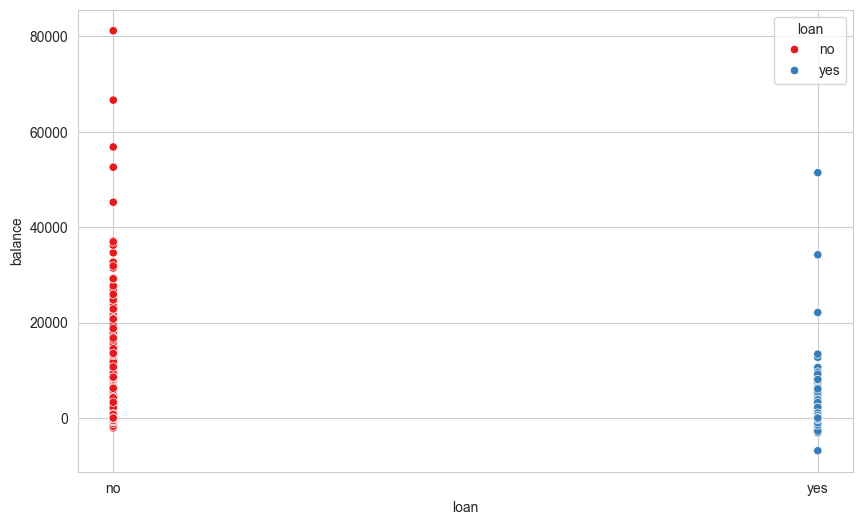

In [49]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 6))
sns.scatterplot(x='loan', y='balance', hue='loan', data=df, palette='Set1')

plt.xlabel('loan')
plt.ylabel('balance')
plt.legend(title='loan')
plt.show()

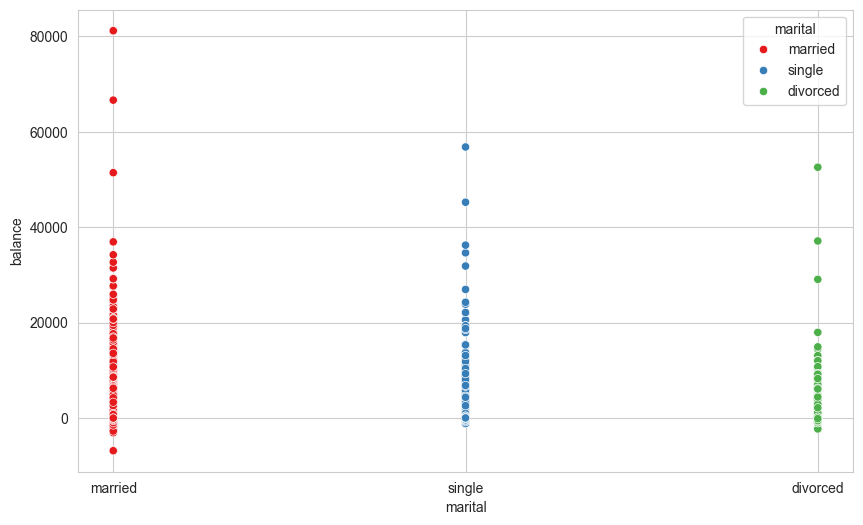

In [50]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 6))
sns.scatterplot(x='marital', y='balance', hue='marital', data=df, palette='Set1')

plt.xlabel('marital')
plt.ylabel('balance')
plt.legend(title='marital')
plt.show()

marital and loan have great impact on balance

### housing

In [51]:
df['housing'].value_counts()/df['housing'].shape[0]*100

housing
no     52.662245
yes    47.337755
Name: count, dtype: float64

<Axes: xlabel='housing', ylabel='Count'>

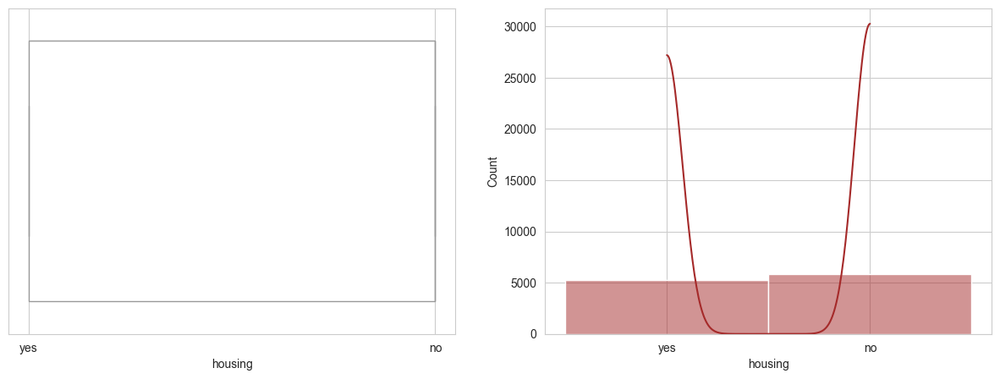

In [52]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(x = df['housing'],color='white')
plt.subplot(1,2,2)
sns.histplot(x = df['housing'], kde=True,color='brown')

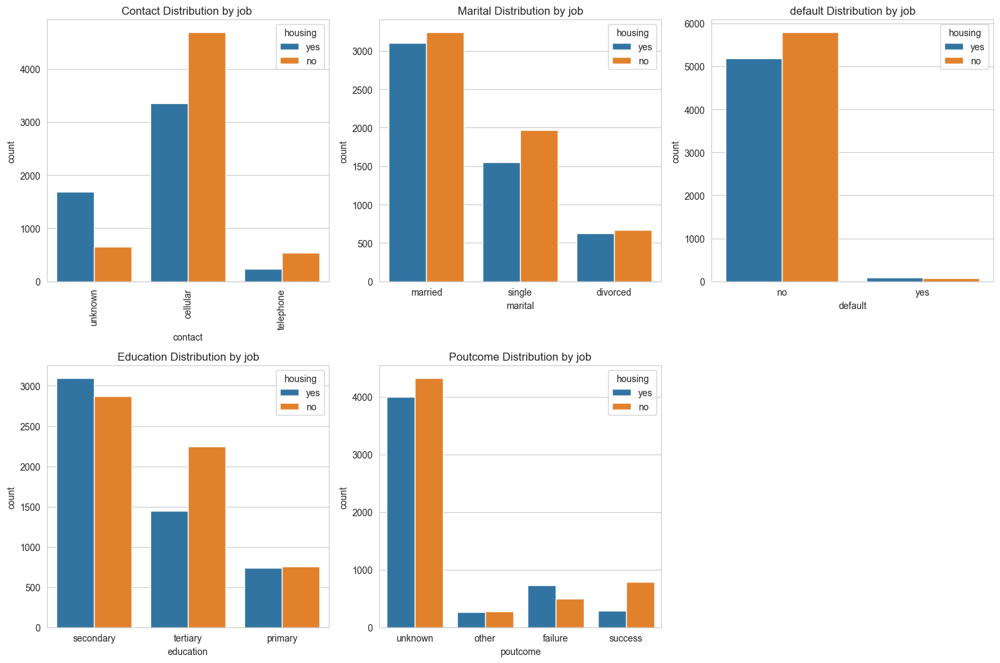

In [53]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

# Plot count plots for each feature grouped by 'job'
sns.countplot(x='contact', hue='housing', data=df, ax=axes[0, 0])
axes[0, 0].set_title('Contact Distribution by job ')
axes[0, 0].set_xticklabels(axes[0, 0].get_xticklabels(), rotation=90)

sns.countplot(x='marital', hue='housing', data=df, ax=axes[0, 1])
axes[0, 1].set_title('Marital Distribution by job')

sns.countplot(x='default', hue ='housing',data = df , ax=axes[0,2])
axes[0, 2].set_title('default Distribution by job')

sns.countplot(x='education', hue='housing', data=df, ax=axes[1, 0])
axes[1, 0].set_title('Education Distribution by job')

sns.countplot(x='poutcome', hue='housing', data=df, ax=axes[1, 1])
axes[1, 1].set_title('Poutcome Distribution by job')

fig.delaxes(axes[1, 2])

plt.tight_layout()
plt.show()

most housing loans are cellular , married , default cc , have secondary education ,and poutcome is unknown

### loan

In [54]:
df['loan'].value_counts()/df['loan'].shape[0]*100

loan
no     86.912872
yes    13.087128
Name: count, dtype: float64

<Axes: xlabel='loan', ylabel='Count'>

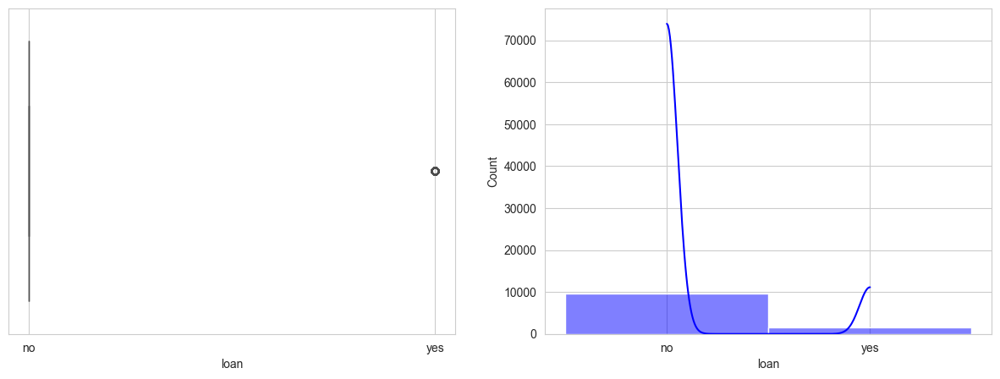

In [55]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(x = df['loan'],color='blue')
plt.subplot(1,2,2)
sns.histplot(x = df['loan'], kde=True,color='blue')

<Axes: xlabel='loan', ylabel='balance'>

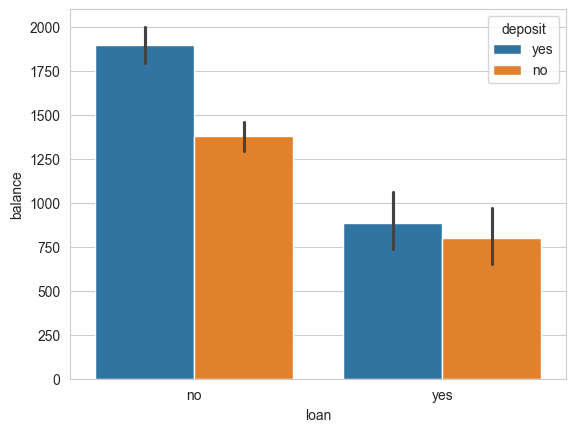

In [56]:
sns.barplot(x="loan", y="balance", hue="deposit", data=df)

### pdays

In [57]:
df['pdays'].value_counts()/df['pdays'].shape[0]*100

pdays
-1      74.560774
 92      0.950161
 182     0.797777
 91      0.752958
 181     0.726067
          ...    
 437     0.008964
 728     0.008964
 518     0.008964
 828     0.008964
 118     0.008964
Name: count, Length: 472, dtype: float64

more than 74% of the data are never contacted before

In [58]:
df[['pdays']].describe().T

,count,mean,std,min,25%,50%,75%,max
pdays,11156.0,51.358551,108.780754,-1.0,-1.0,-1.0,21.25,854.0


-1 may stands for never contacted before and it is the mean
lets chech for outliers

<Axes: xlabel='pdays', ylabel='Count'>

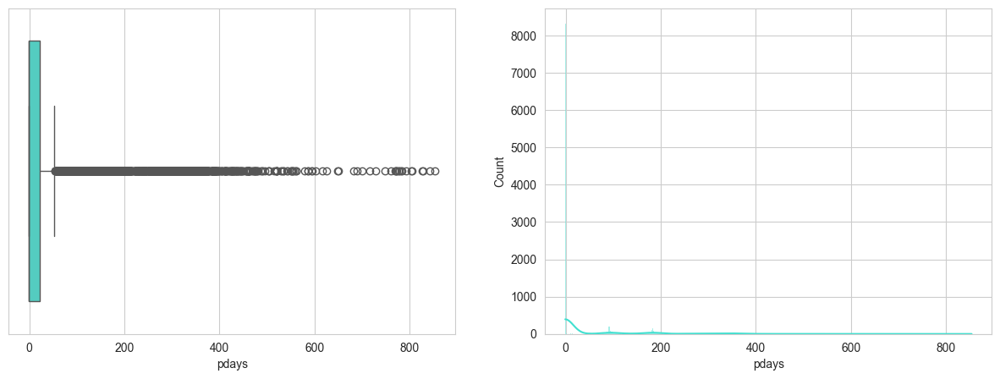

In [59]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(x = df['pdays'],color='turquoise')
plt.subplot(1,2,2)
sns.histplot(x = df['pdays'], kde=True,color='turquoise')

In [60]:
df['pdays'].value_counts()/df['pdays'].shape[0]*100

pdays
-1      74.560774
 92      0.950161
 182     0.797777
 91      0.752958
 181     0.726067
          ...    
 437     0.008964
 728     0.008964
 518     0.008964
 828     0.008964
 118     0.008964
Name: count, Length: 472, dtype: float64

In [61]:
len (df[df['pdays'] > 400] ) / len(df) * 100

1.2011473646468267

will replace values which are > 400 with the mean in pdays

### campaign

In [62]:
df['campaign'].value_counts()/df['campaign'].shape[0]*100

campaign
1     42.981355
2     27.133381
3     11.832198
4      6.911079
5      3.388311
6      2.375403
7      1.245966
8      1.138401
9      0.645393
10     0.466117
11     0.358551
13     0.268914
12     0.259950
14     0.134457
17     0.125493
15     0.116529
16     0.080674
18     0.071710
21     0.071710
20     0.044819
19     0.044819
24     0.044819
22     0.035855
30     0.035855
23     0.026891
25     0.026891
26     0.026891
32     0.017928
43     0.017928
29     0.017928
33     0.008964
28     0.008964
41     0.008964
27     0.008964
63     0.008964
31     0.008964
Name: count, dtype: float64

In [63]:
df[['campaign']].describe().T


,count,mean,std,min,25%,50%,75%,max
campaign,11156.0,2.508336,2.722192,1.0,1.0,2.0,3.0,63.0


<Axes: xlabel='campaign', ylabel='Count'>

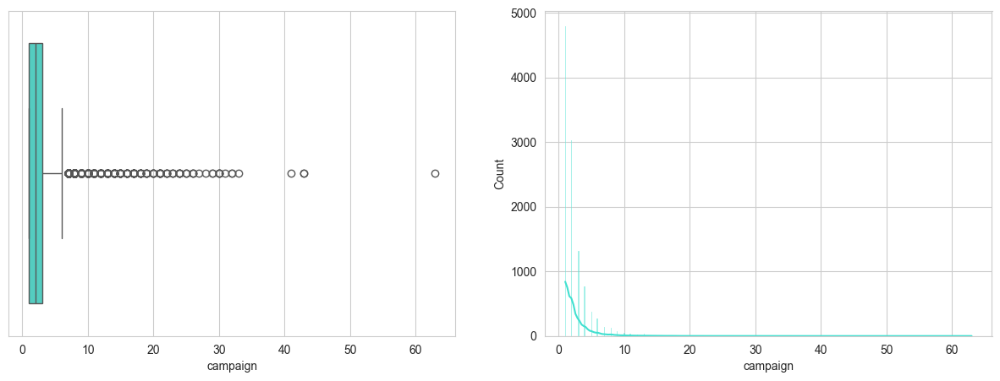

In [64]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(x = df['campaign'],color='turquoise')
plt.subplot(1,2,2)
sns.histplot(x = df['campaign'], kde=True,color='turquoise')

In [65]:
len (df[df['campaign'] > 20] ) / len(df) * 100


0.3764790247400502

will replace values greater than 20 in the 'campaign' column with the average of the 'campaign' column

### previous

In [66]:
df[['previous']].describe().T


,count,mean,std,min,25%,50%,75%,max
previous,11156.0,0.833005,2.292542,0.0,0.0,0.0,1.0,58.0


In [67]:
df['previous'].value_counts()/df['previous'].shape[0]*100

previous
0     74.560774
1      7.950878
2      6.211904
3      3.899247
4      2.187164
5      1.479025
6      1.048763
7      0.690212
8      0.537827
9      0.304769
10     0.268914
11     0.206167
12     0.143421
13     0.098602
17     0.098602
14     0.053783
15     0.044819
19     0.035855
16     0.017928
20     0.017928
27     0.017928
23     0.017928
40     0.008964
41     0.008964
28     0.008964
18     0.008964
58     0.008964
55     0.008964
26     0.008964
21     0.008964
22     0.008964
30     0.008964
29     0.008964
37     0.008964
Name: count, dtype: float64

<Axes: xlabel='previous', ylabel='Count'>

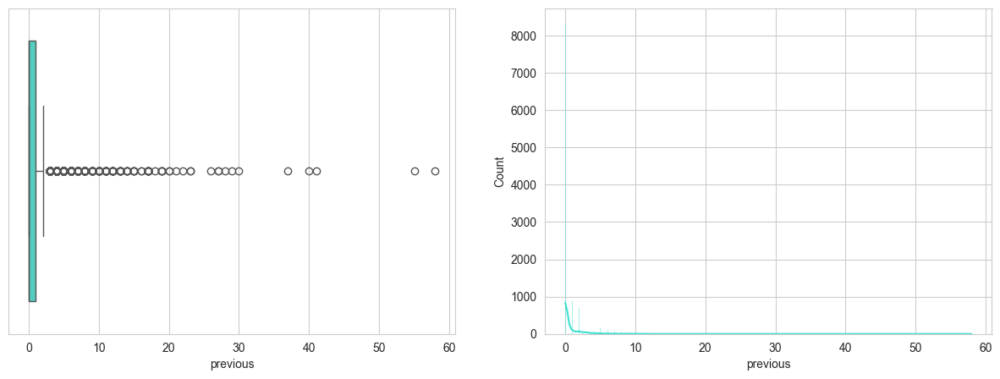

In [68]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(x = df['previous'],color='turquoise')
plt.subplot(1,2,2)
sns.histplot(x = df['previous'], kde=True,color='turquoise')

In [69]:
len (df[df['previous'] > 20] ) / len(df) * 100


0.13445679455001794

previous Number of contacts performed before this campaign for this individual.
it is so wierd to call someone more than 20 times for a campain so will consider more than 10 is an outlier

### deposit

In [70]:
df['deposit'].value_counts()

deposit
no     5868
yes    5288
Name: count, dtype: int64

<Axes: ylabel='count'>

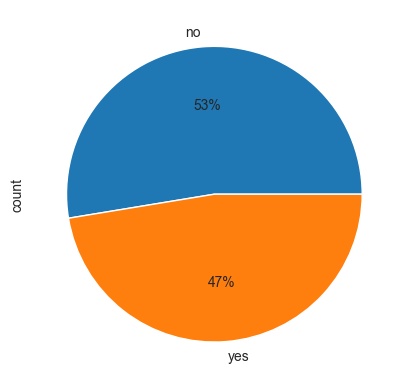

In [71]:
df["deposit"].value_counts().plot.pie(autopct='%1.f%%')

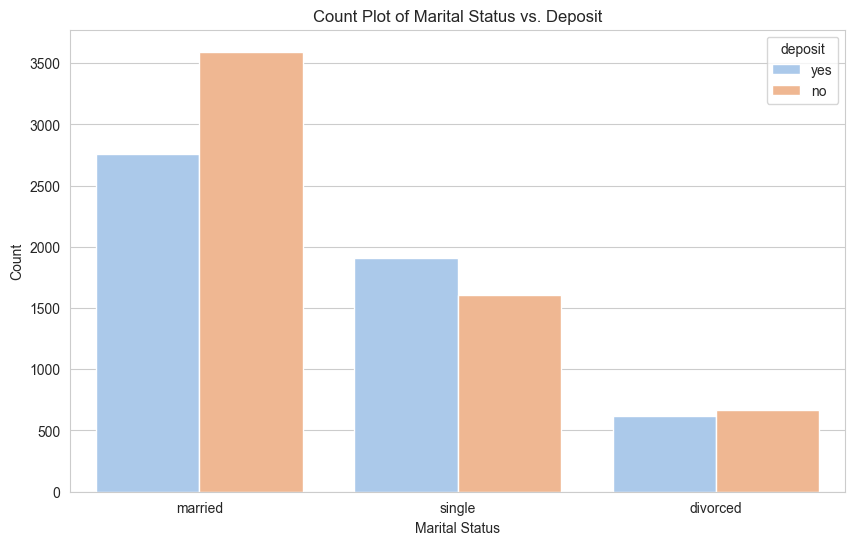

In [72]:
plt.figure(figsize=(10, 6))
sns.countplot(x='marital', hue='deposit', data=df, palette='pastel')
plt.title('Count Plot of Marital Status vs. Deposit')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.show()

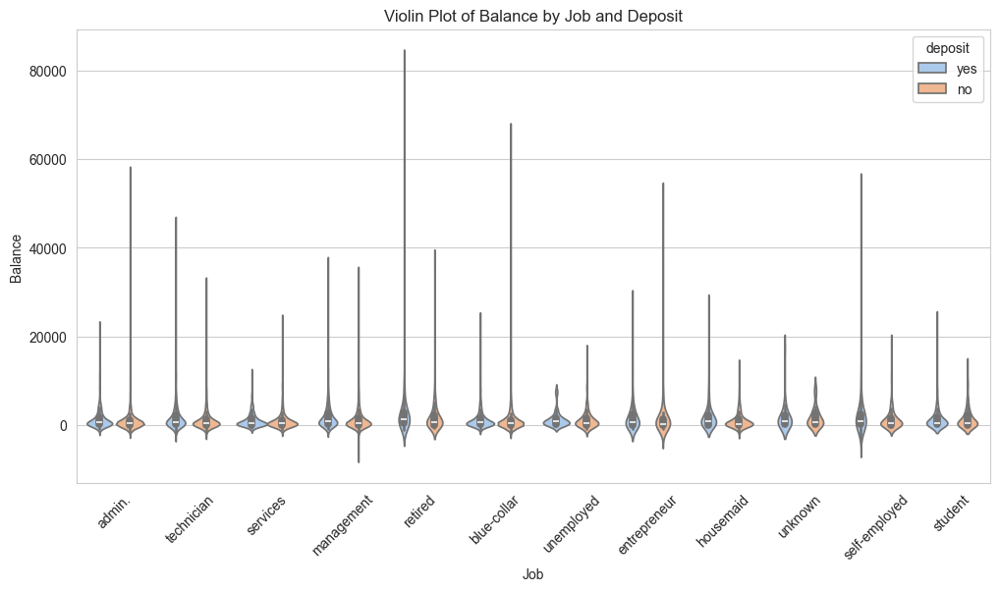

In [73]:
plt.figure(figsize=(12, 6))
sns.violinplot(x='job', y='balance', hue='deposit', data=df, palette='pastel')
plt.xlabel('Job')
plt.ylabel('Balance')
plt.xticks(rotation=45)
plt.title('Violin Plot of Balance by Job and Deposit')
plt.show()

<Axes: xlabel='education', ylabel='balance'>

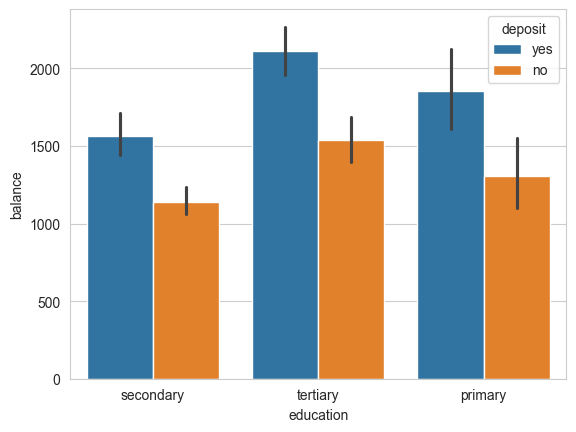

In [74]:
sns.barplot(x="education", y="balance", hue="deposit", data=df)

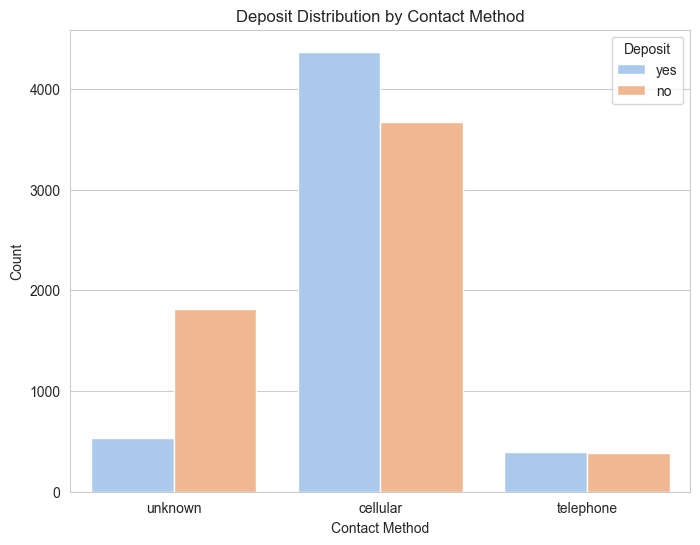

In [75]:
plt.figure(figsize=(8, 6))
sns.countplot(x='contact', hue='deposit', data=df, palette='pastel')
plt.title('Deposit Distribution by Contact Method')
plt.xlabel('Contact Method')
plt.ylabel('Count')
plt.legend(title='Deposit', loc='upper right')
plt.show()

ppl with jobs blue coller and srvices are least that subscribe to term deposit , marrid and Customers with 'unknown' and 'cellular' type of contact are less likely to subscribe for term deposit


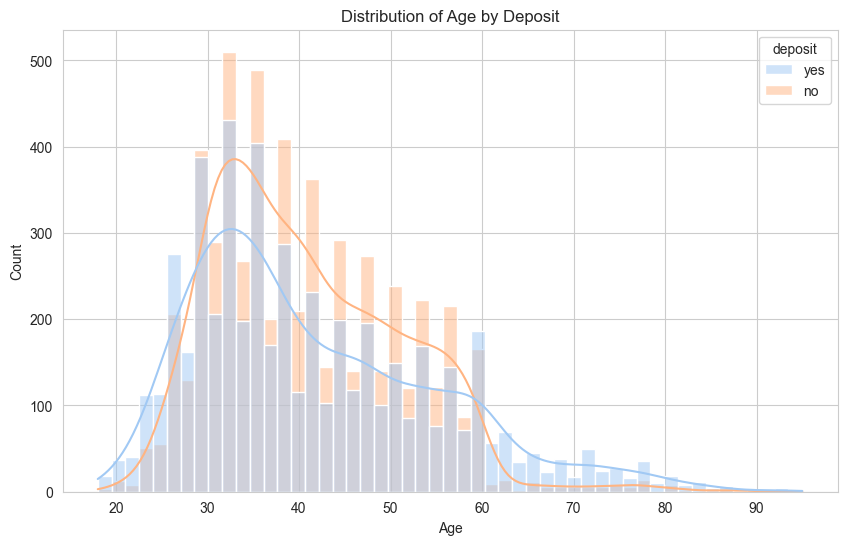

In [76]:
plt.figure(figsize=(10, 6))
sns.histplot(x='age', hue='deposit', data=df, kde=True, palette='pastel')
plt.title('Distribution of Age by Deposit')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

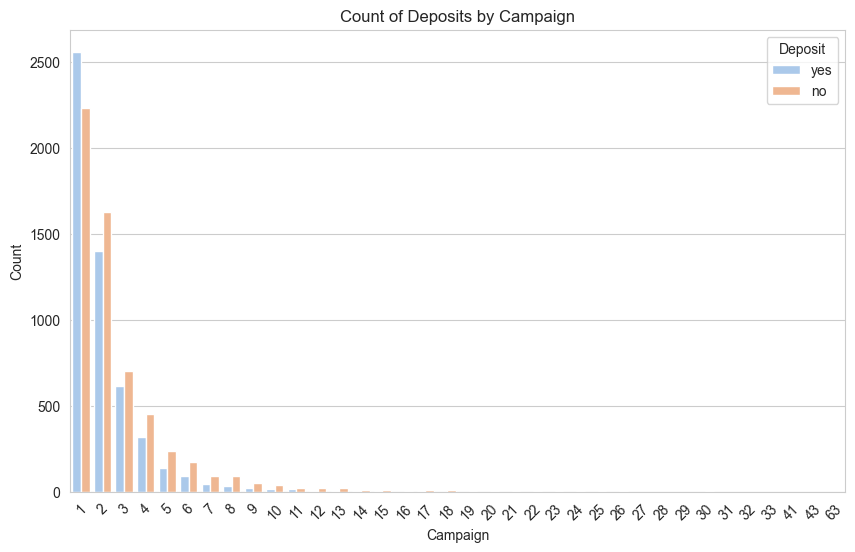

In [77]:
plt.figure(figsize=(10, 6))
sns.countplot(x='campaign', hue='deposit', data=df, palette='pastel')
plt.title('Count of Deposits by Campaign')
plt.xlabel('Campaign')
plt.ylabel('Count')
plt.legend(title='Deposit', loc='upper right')
plt.xticks(rotation=45)
plt.show()

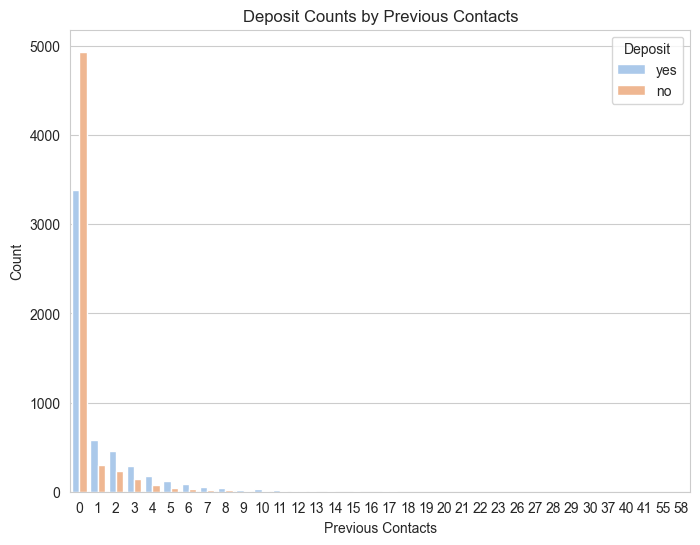

In [78]:
plt.figure(figsize=(8, 6))
sns.countplot(x='previous', hue='deposit', data=df, palette='pastel')
plt.title('Deposit Counts by Previous Contacts')
plt.xlabel('Previous Contacts')
plt.ylabel('Count')
plt.legend(title='Deposit')
plt.show()

People who subscribed for term deposit tend to have greater balance and age values.and mostly retired

also, have fewer number of contacts during this campaign.

### poutcome

In [79]:
df[['poutcome']].describe().T


,count,unique,top,freq
poutcome,11156,4,unknown,8320


In [80]:
df['poutcome'].value_counts()/df['poutcome'].shape[0]*100

poutcome
unknown    74.578702
failure    11.007530
success     9.600215
other       4.813553
Name: count, dtype: float64

<Axes: xlabel='poutcome', ylabel='balance'>

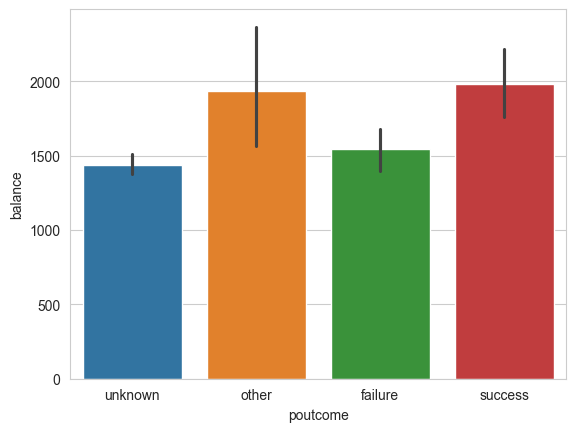

In [81]:
sns.barplot(x="poutcome", y="balance", hue="poutcome", data=df)

<Axes: xlabel='poutcome', ylabel='Count'>

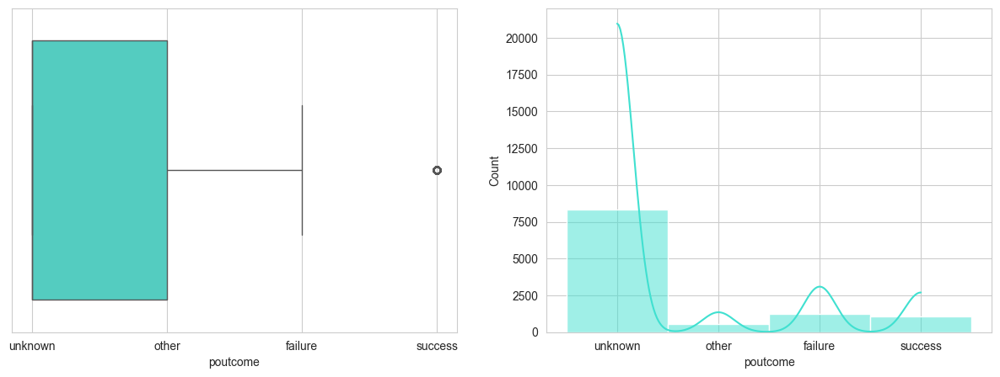

In [82]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(x = df['poutcome'],color='turquoise')
plt.subplot(1,2,2)
sns.histplot(x = df['poutcome'], kde=True,color='turquoise')

<Axes: xlabel='poutcome', ylabel='balance'>

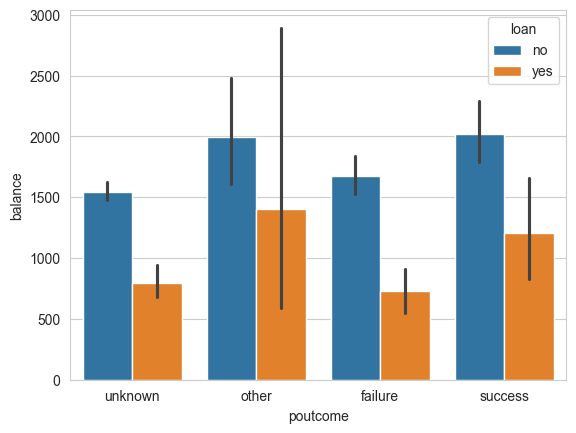

In [83]:
sns.barplot(x="poutcome", y="balance", hue="loan", data=df)

### month

In [84]:
df[['month']].describe().T

,count,unique,top,freq
month,11156,12,may,2823


In [85]:
df['month'].value_counts()/df['month'].shape[0]*100

month
may    25.304769
aug    13.615991
jul    13.571172
jun    10.917892
nov     8.452850
apr     8.273575
feb     6.955898
oct     3.504840
jan     3.083542
sep     2.859448
mar     2.474005
dec     0.986016
Name: count, dtype: float64

In [86]:
# fig=px.bar(df.month.value_counts().reset_index().rename(columns={'index':'Month','month':'Count'}),x='Month',y='Count',color='Month',text='Count',template='simple_white')
# fig.update_traces(marker=dict(line=dict(color='#000000', width=1.2)))
# fig.update_layout(title_x=0.5,title_text='<b>Last Contact Month of the year',font_family="Times New Roman",title_font_family="Times New Roman")

In [87]:
a=df.groupby(['month','deposit'],as_index=False)['age'].count().rename(columns={'age':'Count'})
a['percent']=round(a['Count']*100/a.groupby('month')['Count'].transform('sum'),1)
a['percent']=a['percent'].apply(lambda x: '{}%'.format(x))
fig=px.bar(a,x='month',y='Count',text='percent',color='deposit',barmode='group',template='simple_white',color_discrete_sequence=['MediumPurple','YellowGreen'])
fig.update_layout(title_x=0.5,template='simple_white',showlegend=True,legend_title_text="Deposit",title_text='<b style="color:black; font-size:100%;">Deposits based on last Contact month',font_family="Times New Roman",title_font_family="Times New Roman")
fig.update_traces(marker=dict(line=dict(color='#000000', width=1)),textposition = "outside")
fig.show()


Most of the clients in the bank are contacted in the months of May, Jun, Jul and in Aug last year.
very few of the clients are contacted in the months of Sep, Mar and in De

### the whole data

array([[<Axes: title={'center': 'age'}>,
        <Axes: title={'center': 'balance'}>,
        <Axes: title={'center': 'day'}>],
       [<Axes: title={'center': 'duration'}>,
        <Axes: title={'center': 'campaign'}>,
        <Axes: title={'center': 'pdays'}>],
       [<Axes: title={'center': 'previous'}>, <Axes: >, <Axes: >]],
      dtype=object)

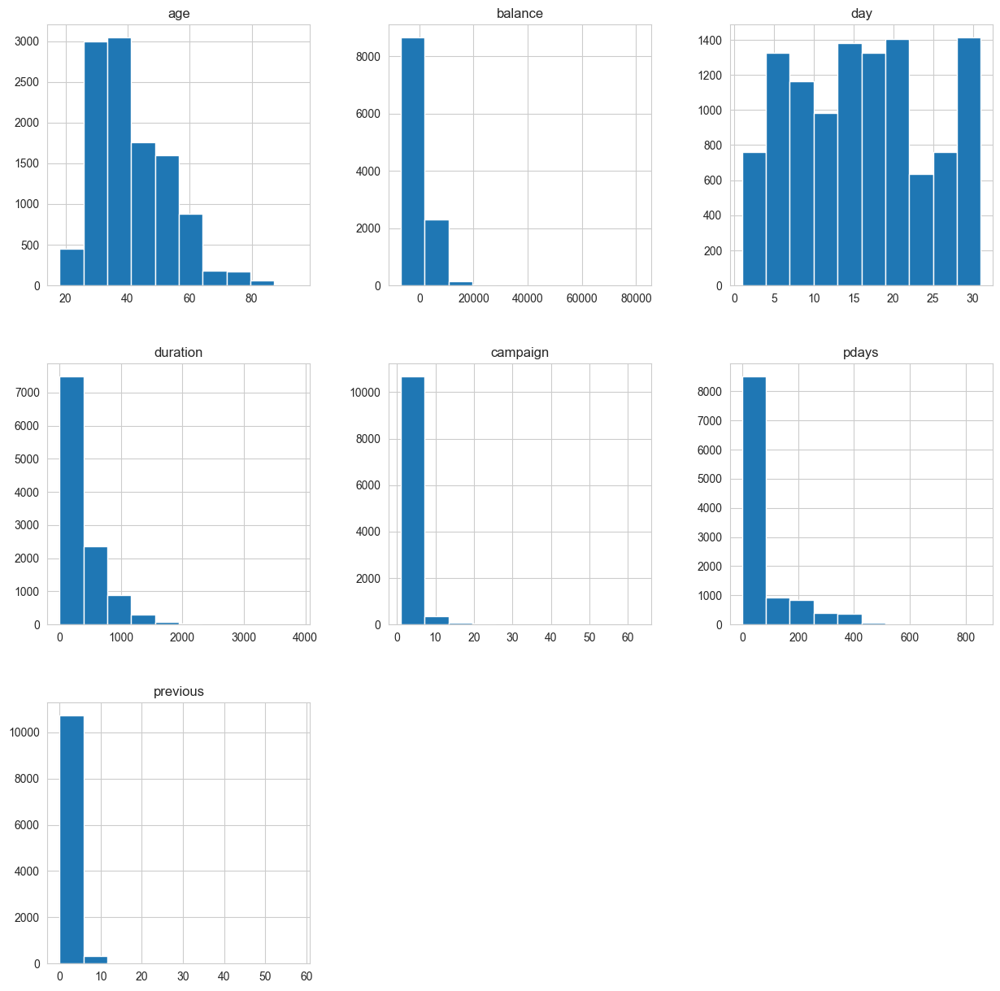

In [88]:
df.hist(figsize =(15 , 15))



*   right skewness in pdays , campaign , duration , blalence  , previos
*   there might be outliers also in the above mentioned columns



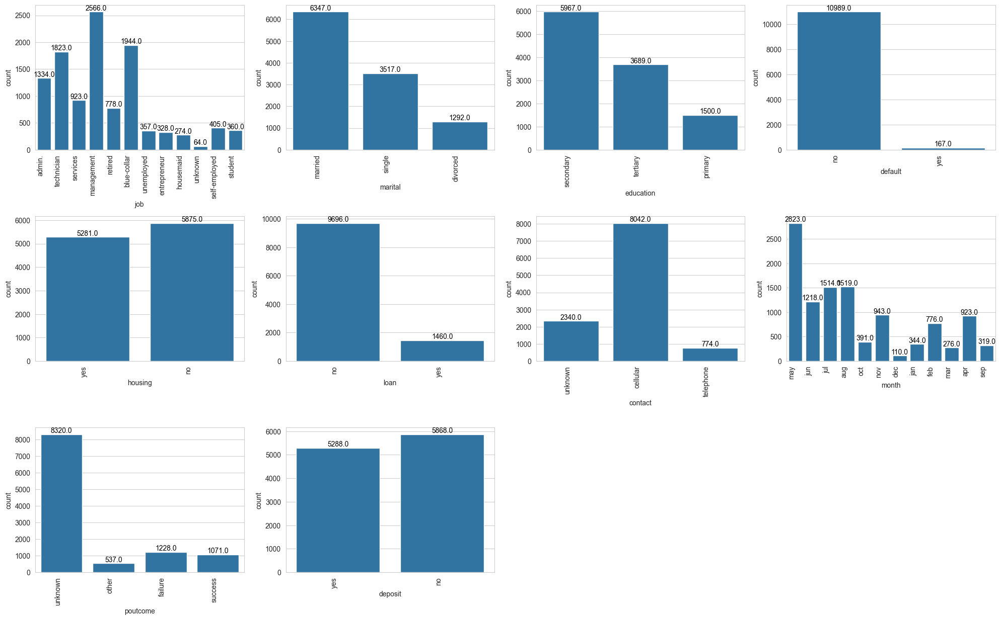

In [89]:
fig = plt.figure(figsize=(20, 20))
for idx, col in enumerate(categ_cols, 1):
    ax = fig.add_subplot(5, 4, idx)
    sns.countplot(x=df[col], ax=ax)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')  # Rotate x-axis labels

    # Add count values on each bar
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                    textcoords='offset points')

plt.tight_layout()
plt.show()

most of the bank's clients are secondry. Most of the clients are married  ,The proportion of clients with and without housing loans is roughly similar, have no credit in default or personal loans(which is logical as the campagin is targetting the ppl that dont have cc)

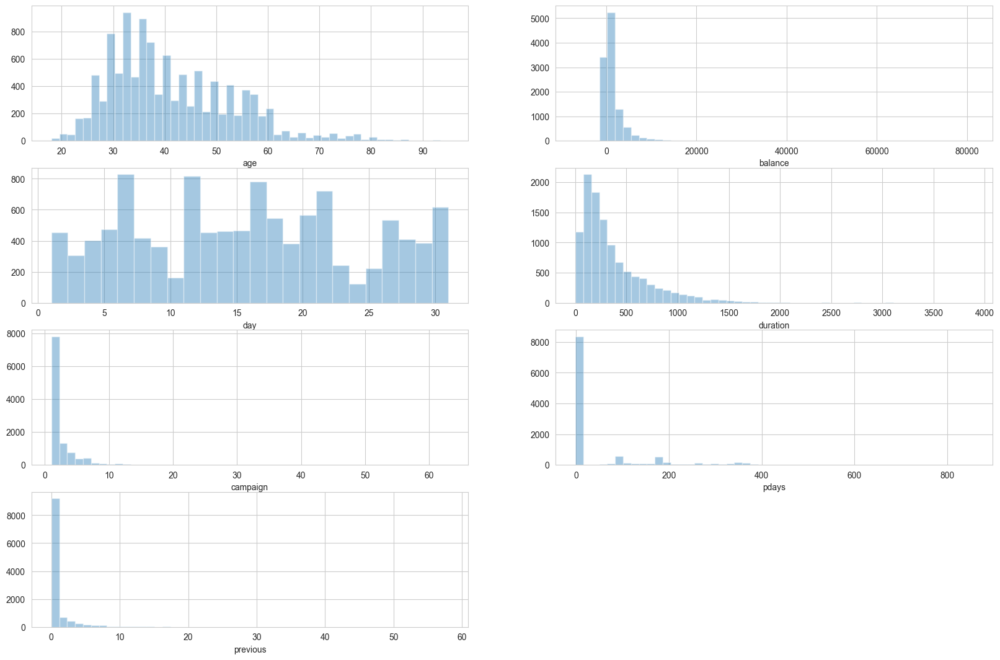

In [90]:
plt.figure(figsize=(20,30))
for i, col in enumerate(df[num_cols].columns):
    ax = plt.subplot(9, 2, i+1)
    sns.distplot(df[col], ax=ax,kde=False)
    plt.xlabel(col)

plt.show()

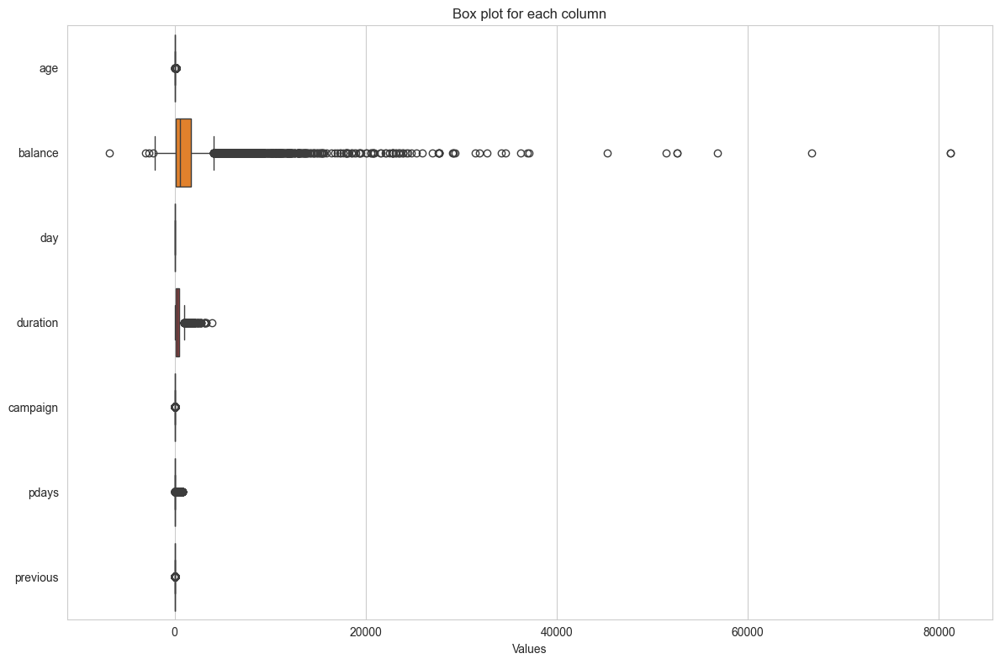

In [91]:
plt.figure(figsize=(12,8))
sns.boxplot(df, orient='h')
plt.title('Box plot for each column')
plt.xlabel('Values')
plt.tight_layout()
plt.show()

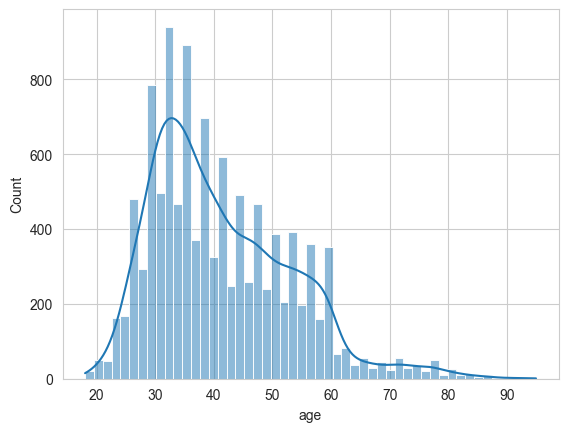

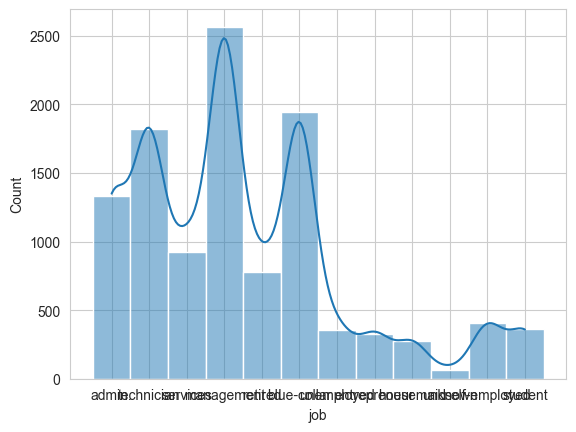

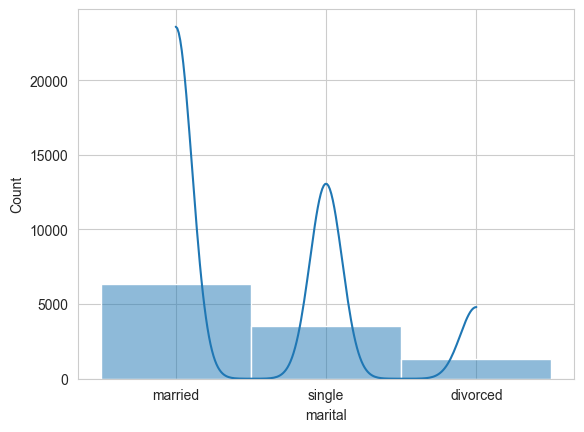

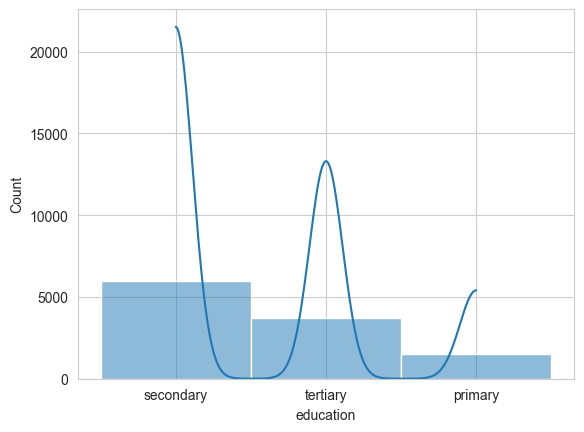

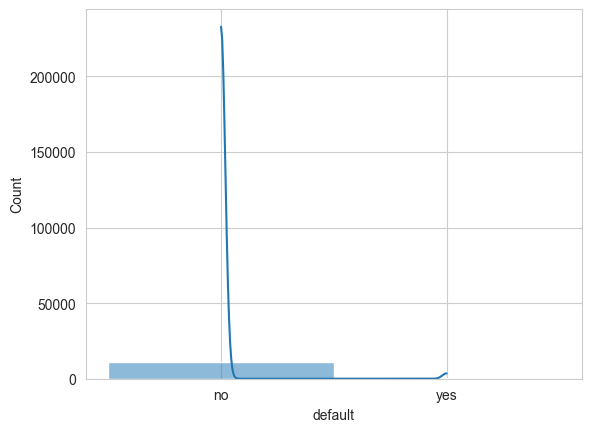

...

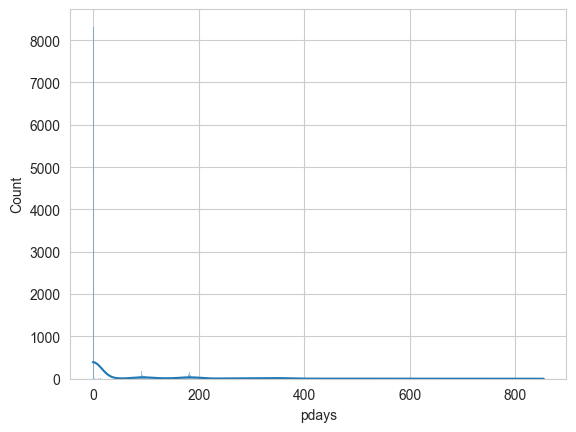

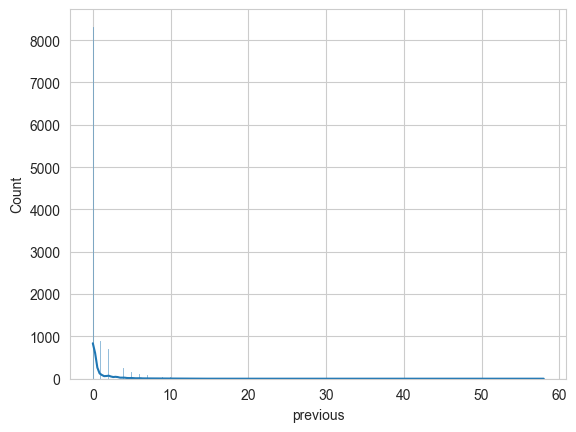

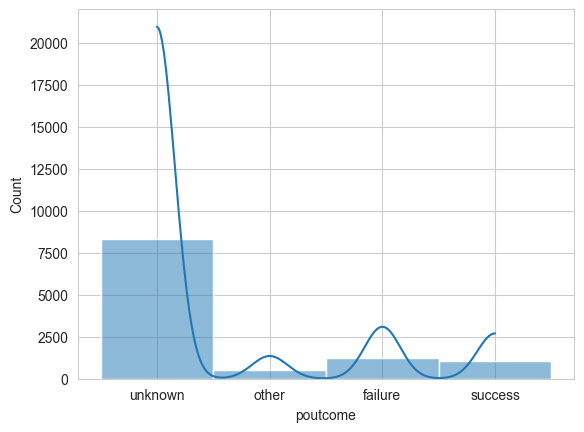

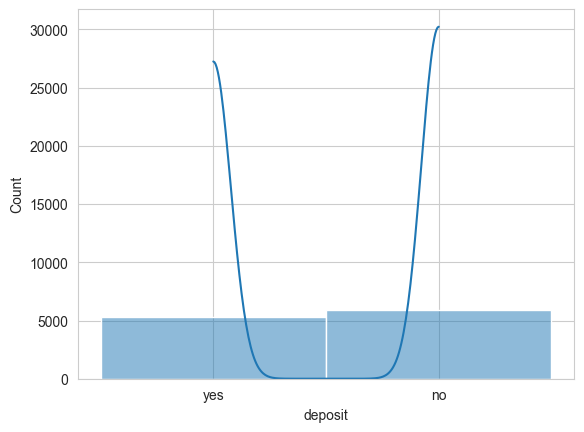

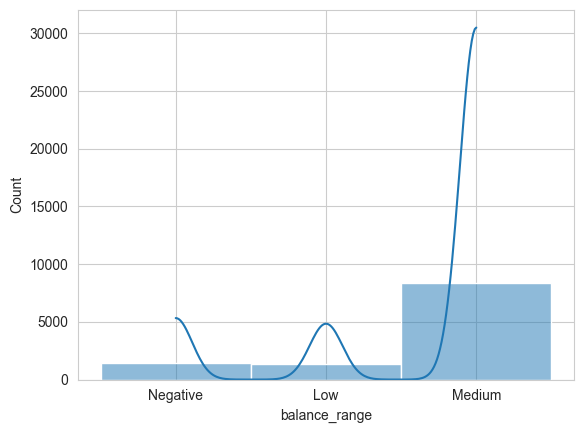

In [92]:
# Checking distribution of columns which have outliers
for col in df.columns:
    sns.histplot(x = df[col], kde=True)
    plt.show()

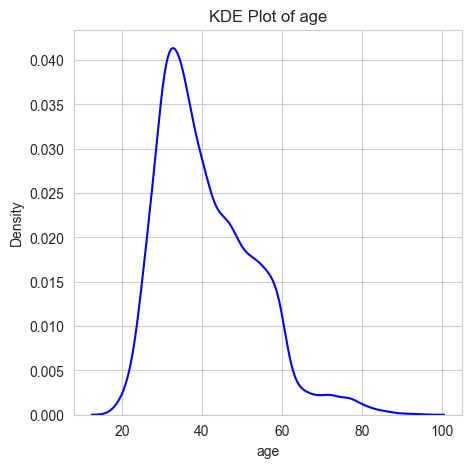

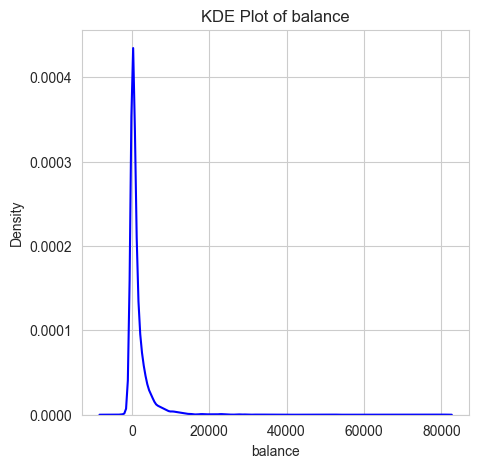

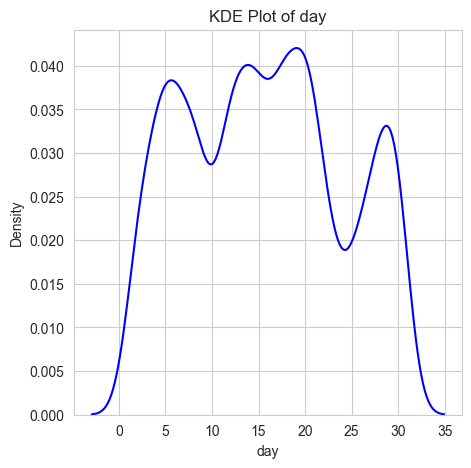

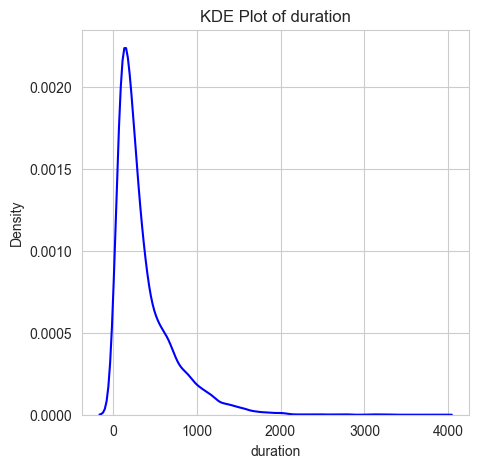

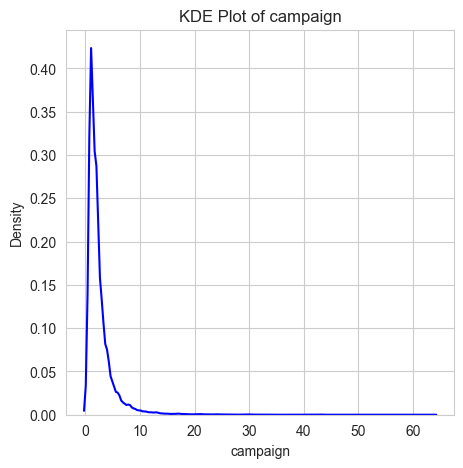

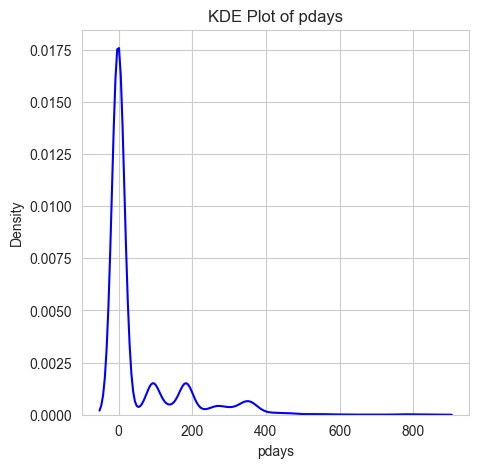

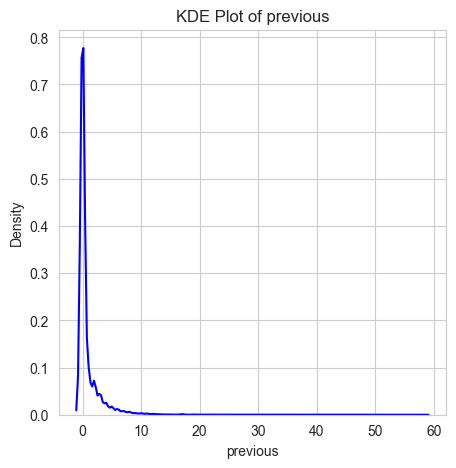

In [93]:
# Filter numerical columns
numerical_cols = df.select_dtypes(include='number').columns

# Plot KDE for numerical columns
for col in numerical_cols:
    plt.figure(figsize=(5, 5))
    sns.kdeplot(data=df, x=col, color='blue')
    plt.title(f'KDE Plot of {col}')
    plt.show()
    print("\n")

.Skewness measures the asymmetry of the data distribution. Negative skewness indicates a left-skewed distribution(no -ve skewness in this data only +ve)
.Kurtosis (bt2iis el peak of freq dist)measures the tailedness of the data distribution. Negative kurtosis suggests a distribution with lighter tails than a normal distribution.(day)

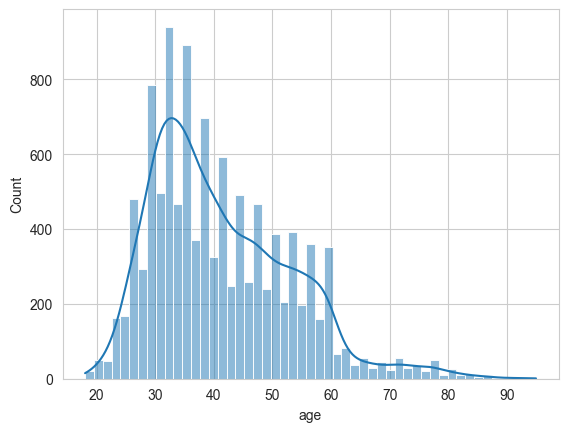

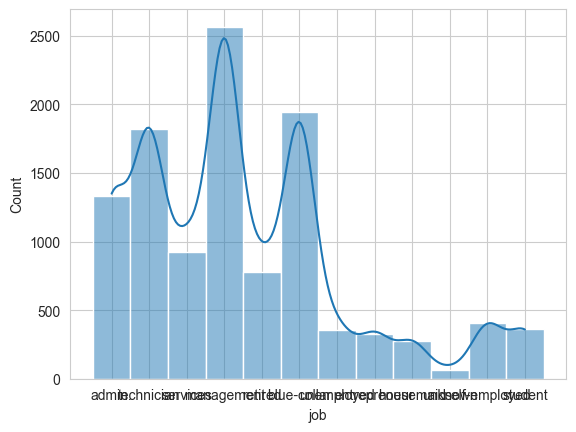

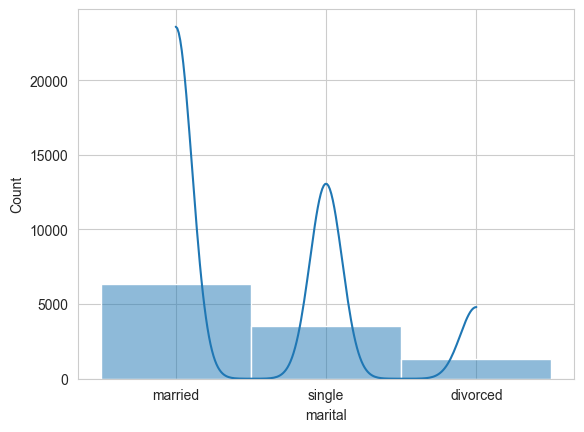

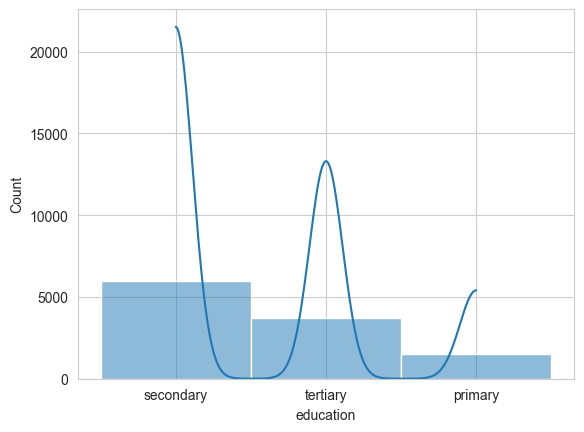

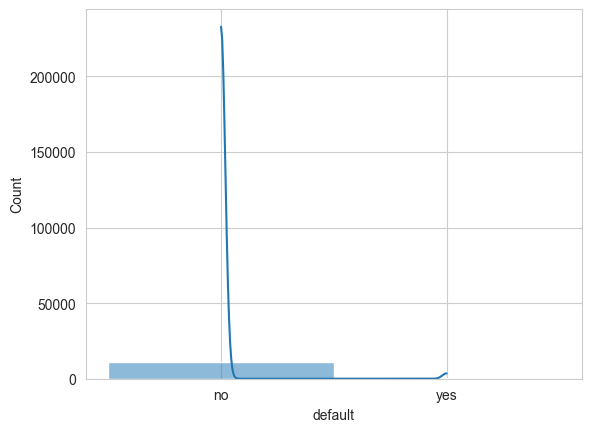

...

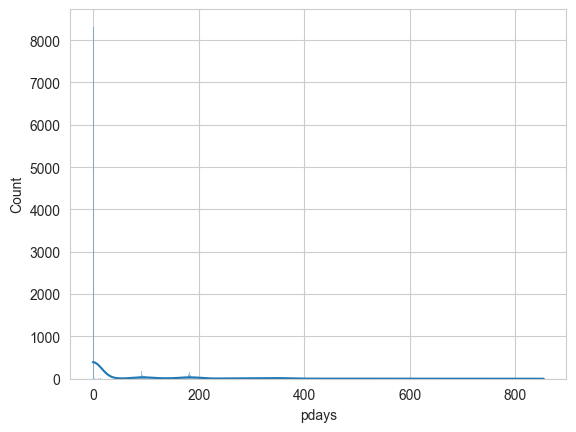

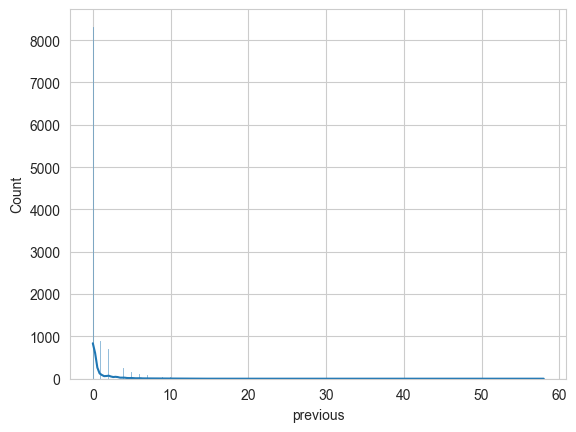

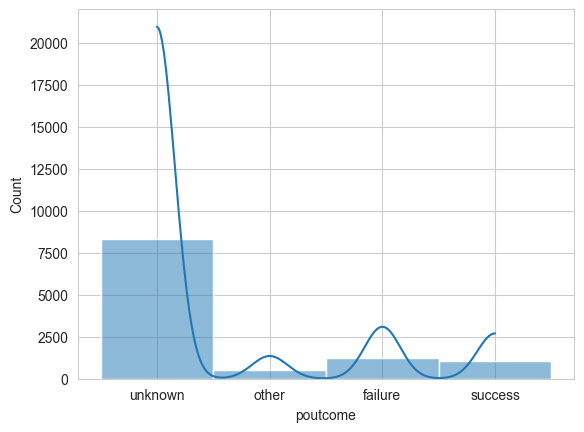

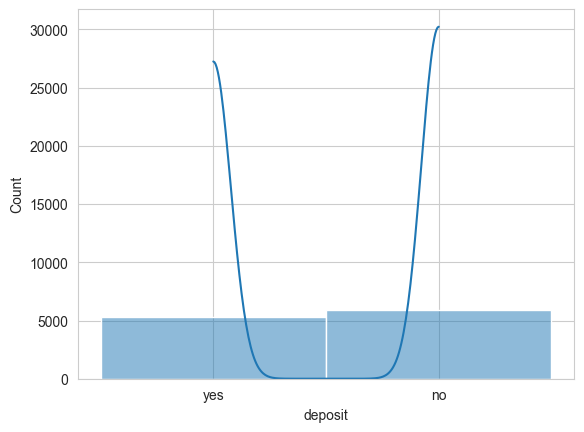

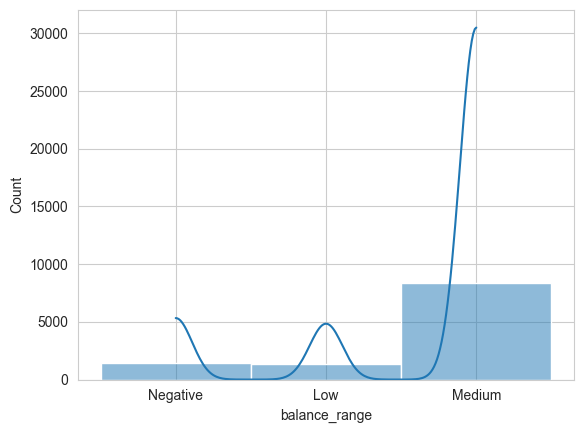

In [94]:
# Checking distribution of columns which have outliers
for col in df.columns:
    sns.histplot(x = df[col], kde=True)
    plt.show()

from whole of the above we concluded
* colums el cont pday , balance
* columns categorical contact , poutcome , marital , education
* columns boolean default , loan , housing , deposit

* no missing value in the dataset.
* no duplicates in the dataset.
* outliers at pdays previos and campagin.


In [95]:
# statistics = df.describe().transpose()

# # Adding skewness and kurtosis to the statistics
# statistics['skewness'] = df.skew()
# statistics['kurtosis'] = df.kurt()
# print(statistics)

# Task 2: Cleaning Data.

1. campaign : will replace values greater than 20 in the 'campaign' column with the average of the 'campaign' column

---

2. pdays: will replace values which are > 400 with the mean in pdays


---

3. previous :  Number of contacts performed before this campaign for this individual. it is so wierd to call someone more than 10 times for a campain so will consider more than 10 is an outlier len (df[df['previous'] > 10] ) / len(df) * 100 and compute it with the avg

---


4. job : no outliers so fill by mode

---

5. ##contact : that imputation techniques such as k-nearest neighbors (KNN) imputation or
predictive modeling to fill in the missing values based on other features.
3mlt replace bl mode


In [96]:
avg_campaign = df['campaign'].mean()

df.loc[df['campaign'] > 20, 'campaign'] = avg_campaign


In [97]:
mean_pdays = df['pdays'].mean()
df.loc[df['pdays'] > 400, 'pdays'] = mean_pdays

In [98]:
avg_previous = df['previous'].mean()
outliers_percentage = (len(df[df['previous'] > 20]) / len(df)) * 100

df.loc[df['previous'] > 20, 'previous'] = avg_previous

print("Outliers Percentage:", outliers_percentage)

Outliers Percentage: 0.13445679455001794


In [99]:
mode_job = df['job'].mode()[0]

# Replace 'unknown' values with the mode
df['job'].replace('unknown', mode_job, inplace=True)

In [100]:
df['contact'].replace('unknown', 'cellular', inplace=True)

In [101]:
import plotly.express as px
fig = px.bar(df, x='poutcome', color='loan', title='Count Plot for poutcome with Hue of Loan',
             color_discrete_map={'yes': 'green', 'no': 'red'},
             labels={'poutcome': 'Outcome', 'loan': 'Loan Status'})

# Show the interactive plot
fig.show()

### **Features Encoding**

In [102]:
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit,balance_range
0,59,admin.,married,secondary,no,2343,yes,no,cellular,5,may,1042,1.0,-1.0,0.0,unknown,yes,Medium
1,56,admin.,married,secondary,no,45,no,no,cellular,5,may,1467,1.0,-1.0,0.0,unknown,yes,Low
2,41,technician,married,secondary,no,1270,yes,no,cellular,5,may,1389,1.0,-1.0,0.0,unknown,yes,Medium
3,55,services,married,secondary,no,2476,yes,no,cellular,5,may,579,1.0,-1.0,0.0,unknown,yes,Medium
4,54,admin.,married,tertiary,no,184,no,no,cellular,5,may,673,2.0,-1.0,0.0,unknown,yes,Medium


In [103]:
cat_columns

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'poutcome', 'deposit'],
      dtype='object')

In [104]:
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()

In [105]:
df['marital']= label_encoder.fit_transform(df['marital'])

In [106]:
df['deposit']= label_encoder.fit_transform(df['deposit'])


In [107]:
df['default']= label_encoder.fit_transform(df['default'])

In [108]:
df['loan']= label_encoder.fit_transform(df['loan'])

In [109]:
df['housing']= label_encoder.fit_transform(df['housing'])

In [110]:
contact_mapping = {'cellular': 1, 'telephone': 0}

# Replace contact values with numerical labels
df['contact_encoded'] = df['contact'].map(contact_mapping)
df.drop(columns=['contact'], inplace=True)

In [111]:
month_mapping = {
    'jan': 1, 'feb': 2, 'mar': 3, 'apr': 4, 'may': 5, 'jun': 6,
    'jul': 7, 'aug': 8, 'sep': 9, 'oct': 10, 'nov': 11, 'dec': 12
}

# Replace month names with numerical labels
df['month_encoded'] = df['month'].map(month_mapping)
df.drop(columns=['month'], inplace=True)

In [112]:
df['poutcome'].replace('unknown', 'other', inplace=True)

In [113]:
poutcome_mapping = {'success': 1, 'failure': 0, 'other': -1}

# Replace poutcome values with numerical labels
df['poutcome_encoded'] = df['poutcome'].map(poutcome_mapping)

In [114]:
df.drop(columns=['poutcome'], inplace=True)

In [115]:
balance_range_mapping = {'Negative': -1, 'Low': 0, 'Medium': 1, 'High': 2}

# Replace balance_range values with numerical labels
df['balance_range_encoded'] = df['balance_range'].map(balance_range_mapping)


In [116]:
df['balance_range_encoded'].value_counts()

balance_range_encoded
1     8366
-1    1462
0     1328
2        0
Name: count, dtype: int64

In [117]:
df.drop(columns=['balance_range'], inplace=True)

In [118]:
df['education_encoded'] = label_encoder.fit_transform(df['education'])

# Encode 'job' column
df['job_encoded'] = label_encoder.fit_transform(df['job'])

In [119]:
df.drop(columns=['job'], inplace=True)

In [120]:
df.drop(columns=['education'], inplace=True)

In [121]:
df

,age,marital,default,balance,housing,loan,day,duration,campaign,pdays,previous,deposit,contact_encoded,month_encoded,poutcome_encoded,balance_range_encoded,education_encoded,job_encoded
0,59,1,0,2343,1,0,5,1042,1.0,-1.0,0.0,1,1,5,-1,1,1,0
1,56,1,0,45,0,0,5,1467,1.0,-1.0,0.0,1,1,5,-1,0,1,0
2,41,1,0,1270,1,0,5,1389,1.0,-1.0,0.0,1,1,5,-1,1,1,9
3,55,1,0,2476,1,0,5,579,1.0,-1.0,0.0,1,1,5,-1,1,1,7
4,54,1,0,184,0,0,5,673,2.0,-1.0,0.0,1,1,5,-1,1,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11157,33,2,0,1,1,0,20,257,1.0,-1.0,0.0,0,1,4,-1,0,0,1
11158,39,1,0,733,0,0,16,83,4.0,-1.0,0.0,0,1,6,-1,1,1,7
11159,32,2,0,29,0,0,19,156,2.0,-1.0,0.0,0,1,8,-1,0,1,9
11160,43,1,0,0,0,1,8,9,2.0,172.0,5.0,0,1,5,0,-1,1,9


In [122]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11156 entries, 0 to 11161
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   age                    11156 non-null  int64   
 1   marital                11156 non-null  int32   
 2   default                11156 non-null  int32   
 3   balance                11156 non-null  int64   
 4   housing                11156 non-null  int32   
 5   loan                   11156 non-null  int32   
 6   day                    11156 non-null  int64   
 7   duration               11156 non-null  int64   
 8   campaign               11156 non-null  float64 
 9   pdays                  11156 non-null  float64 
 10  previous               11156 non-null  float64 
 11  deposit                11156 non-null  int32   
 12  contact_encoded        11156 non-null  int64   
 13  month_encoded          11156 non-null  int64   
 14  poutcome_encoded       11156 non-null  int6

In [123]:
df['balance_range_encoded'] = df['balance_range_encoded'].astype(float)


In [124]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11156 entries, 0 to 11161
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   age                    11156 non-null  int64  
 1   marital                11156 non-null  int32  
 2   default                11156 non-null  int32  
 3   balance                11156 non-null  int64  
 4   housing                11156 non-null  int32  
 5   loan                   11156 non-null  int32  
 6   day                    11156 non-null  int64  
 7   duration               11156 non-null  int64  
 8   campaign               11156 non-null  float64
 9   pdays                  11156 non-null  float64
 10  previous               11156 non-null  float64
 11  deposit                11156 non-null  int32  
 12  contact_encoded        11156 non-null  int64  
 13  month_encoded          11156 non-null  int64  
 14  poutcome_encoded       11156 non-null  int64  
 15  balance

### Normalizing data

In [125]:
# Scaling data
scaler = RobustScaler()
df[num_cols] = scaler.fit_transform(df[num_cols])

# -------------> Robust gives negative values, we should try MinMax
# -------------> or we may shift the values to positive after scaling

In [126]:
def shapiro_test_normality(dataframe, alpha=0.05):
    ##### data should be clean of nulls as shapiro doesn't handle null values

    for column in dataframe.select_dtypes(include=[np.number]).columns:
        data = dataframe[column]
        stat, p = shapiro(data)

        print(f'Column: {column}')
        print(f'  Statistics={stat}, p={p}')

        # Interpret the results
        if p > alpha:
            print(f'{column} appears to be normally distributed.')
        else:
            print(f'{column} does appear to be not normally distributed.')

In [127]:
shapiro_test_normality(df)

Column: age
  Statistics=0.9471136331558228, p=0.0
age does appear to be not normally distributed.
Column: marital
  Statistics=0.7742682695388794, p=0.0
marital does appear to be not normally distributed.
Column: default
  Statistics=0.0969042181968689, p=0.0
default does appear to be not normally distributed.
Column: balance
  Statistics=0.463509202003479, p=0.0
balance does appear to be not normally distributed.
Column: housing
  Statistics=0.6355797648429871, p=0.0
housing does appear to be not normally distributed.
Column: loan
  Statistics=0.3970872759819031, p=0.0
loan does appear to be not normally distributed.
Column: day
  Statistics=0.9591991901397705, p=0.0
day does appear to be not normally distributed.
Column: duration
  Statistics=0.8009542226791382, p=0.0
duration does appear to be not normally distributed.
Column: campaign
  Statistics=0.6473461389541626, p=0.0
campaign does appear to be not normally distributed.
Column: pdays
  Statistics=0.5631282329559326, p=0.0
pda

In [128]:
def QQ_plot_test_normality(dataframe):

    # Selecting numeric columns only
    numeric_cols = dataframe.select_dtypes(include=np.number).columns.tolist()

    # Loop through the numeric columns and create Q-Q plots
    for col in numeric_cols:
        print("")
        sm.qqplot(dataframe[col].dropna(), line='s')  # dropna() to remove missing values, line='s' for standard line
        plt.title(f"Q-Q Plot for {col} column")
        plt.show()

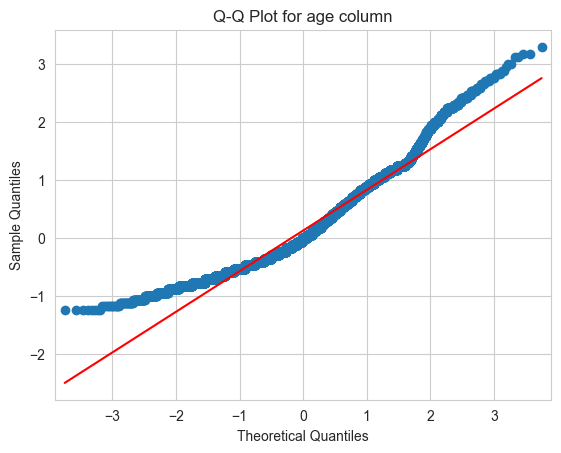

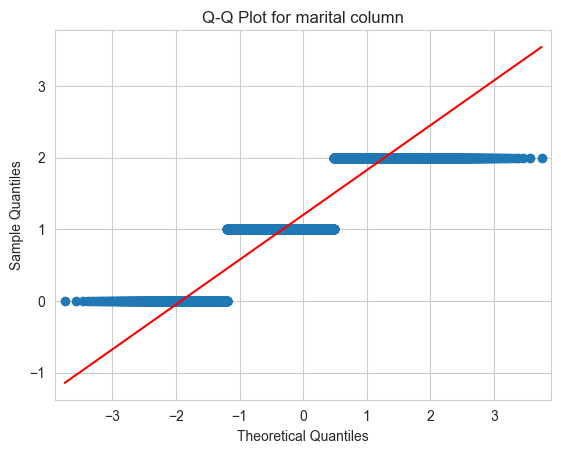

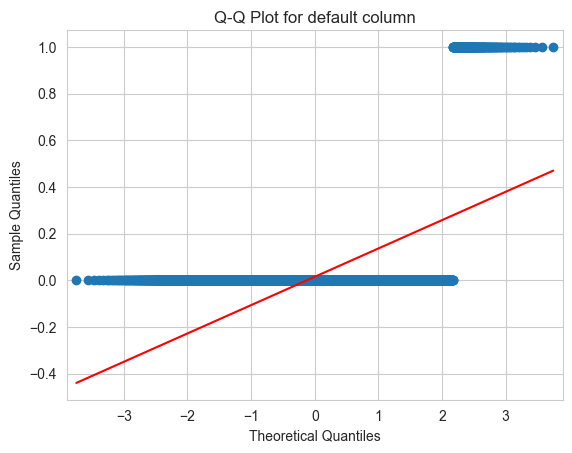

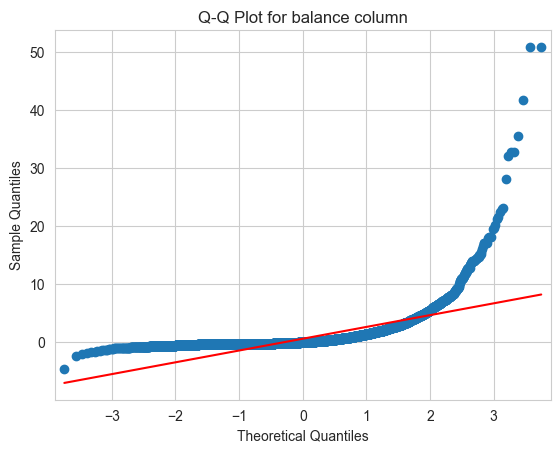

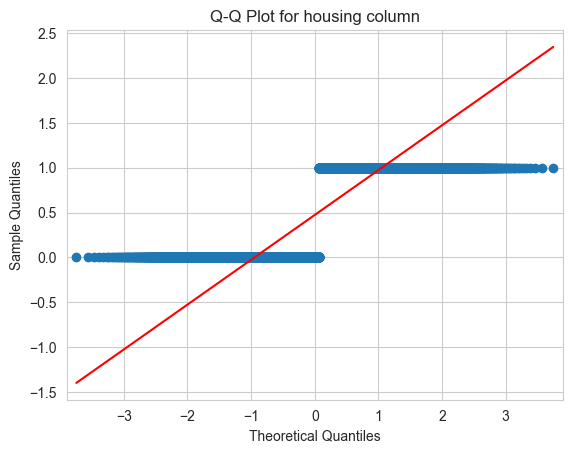

...

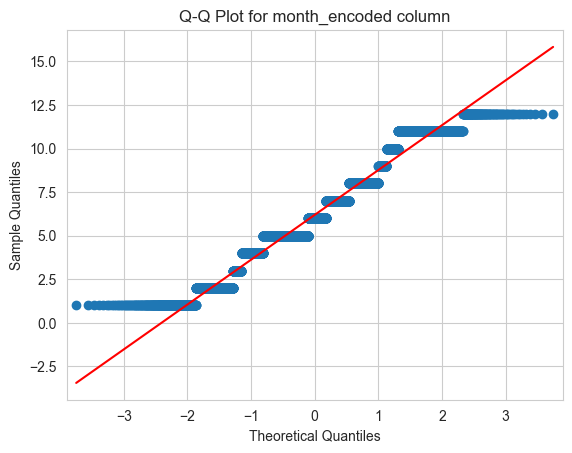

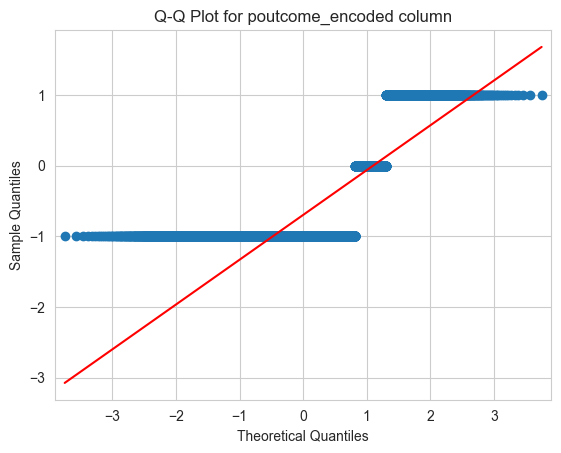

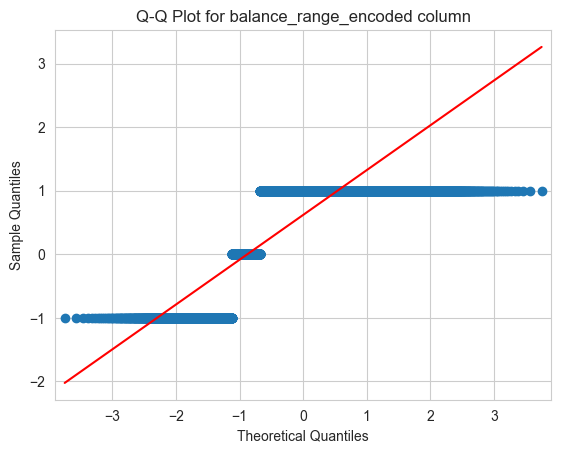

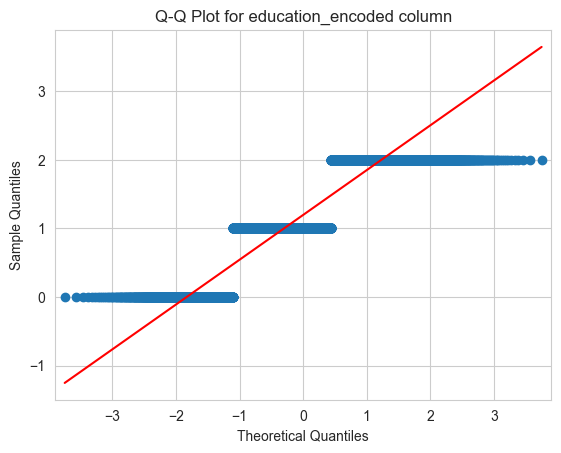

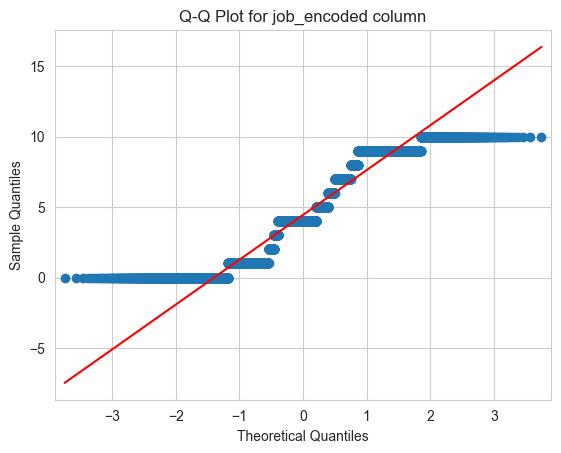

In [129]:
QQ_plot_test_normality(df)

from shapiro and QQ plot test, it appears that the data is not normaly distributed

### Handling Skewness

by using log transform, square root transformation, BoxCox transformation (can handle negative and positive values), etc...

In [130]:
def find_best_transformation(df):
    best_transformations = {}

    for column in df.select_dtypes(include=[np.number]).columns:
        column_data = df[column].dropna()

        # Original Shapiro-Wilk test
        orig_stat, orig_p_value = shapiro(column_data)

        # Log transformation
        log_transformed_data = np.log1p(column_data)
        log_stat, log_p_value = shapiro(log_transformed_data)

        # Square root transformation
        sqrt_transformed_data = np.sqrt(column_data)
        sqrt_stat, sqrt_p_value = shapiro(sqrt_transformed_data)

        # Box-Cox transformation
        if column_data.min() > 0:
            boxcox_transformed_data, _ = boxcox(column_data)
            boxcox_stat, boxcox_p_value = shapiro(boxcox_transformed_data)
        else:
            boxcox_stat, boxcox_p_value = np.nan, np.nan

        # Power transformation using sklearn's PowerTransformer
        power_transformer = PowerTransformer()
        power_transformed_data = power_transformer.fit_transform(column_data.values.reshape(-1, 1))
        power_stat, power_p_value = shapiro(power_transformed_data)

        # Compare p-values and select the best transformation
        transformations = {
            "Original": orig_p_value,
            "Log Transformation": log_p_value,
            "Square Root Transformation": sqrt_p_value,
            "Box-Cox Transformation": boxcox_p_value,
            "Power Transformation": power_p_value
        }

        best_transformation = min(transformations, key=transformations.get)
        best_transformations[column] = {"Best Transformation": best_transformation, "Best P-value": transformations[best_transformation]}

    return best_transformations

In [131]:
find_best_transformation(df)

{'age': {'Best Transformation': 'Original', 'Best P-value': 0.0},
 'marital': {'Best Transformation': 'Original', 'Best P-value': 0.0},
 'default': {'Best Transformation': 'Original', 'Best P-value': 0.0},
 'balance': {'Best Transformation': 'Original', 'Best P-value': 0.0},
 'housing': {'Best Transformation': 'Original', 'Best P-value': 0.0},
 'loan': {'Best Transformation': 'Original', 'Best P-value': 0.0},
 'day': {'Best Transformation': 'Original', 'Best P-value': 0.0},
 'duration': {'Best Transformation': 'Original', 'Best P-value': 0.0},
 'campaign': {'Best Transformation': 'Original', 'Best P-value': 0.0},
 'pdays': {'Best Transformation': 'Original', 'Best P-value': 0.0},
 'previous': {'Best Transformation': 'Original', 'Best P-value': 0.0},
 'deposit': {'Best Transformation': 'Original', 'Best P-value': 0.0},
 'contact_encoded': {'Best Transformation': 'Original', 'Best P-value': 0.0},
 'month_encoded': {'Best Transformation': 'Original', 'Best P-value': 0.0},
 'poutcome_encod

conclusion: data is not normally distributed but does not matter, we will use it as it is

data original state is the best transformation, but the data still not normally distributed

## Outliers

### Checking for outliers

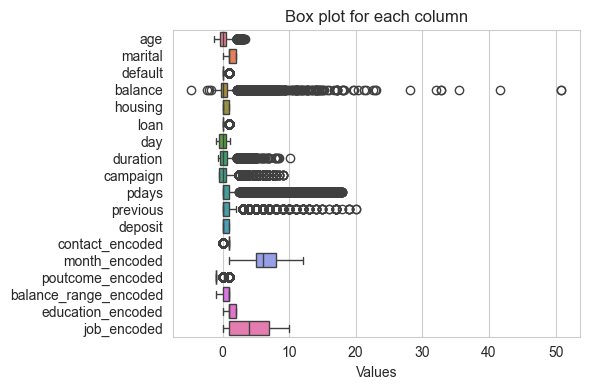

In [132]:
plt.figure(figsize=(6,4))
sns.boxplot(df, orient='h')
plt.title('Box plot for each column')
plt.xlabel('Values')
plt.tight_layout()
plt.show()

In [133]:
df.dtypes


age                      float64
marital                    int32
default                    int32
balance                  float64
housing                    int32
loan                       int32
day                      float64
duration                 float64
campaign                 float64
pdays                    float64
previous                 float64
deposit                    int32
contact_encoded            int64
month_encoded              int64
poutcome_encoded           int64
balance_range_encoded    float64
education_encoded          int32
job_encoded                int32
dtype: object

In [134]:
# Function to identify outliers based on IQR
def find_outliers(column):
    Q1 = np.percentile(column, 25)
    Q3 = np.percentile(column, 75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = (column < lower_bound) | (column > upper_bound)

    return outliers

In [135]:
for column in df.columns:
    # Check if the column is numeric (assuming outliers are relevant for numeric data)

      outliers = find_outliers(df[column])
      num_outliers = outliers.sum()

      print(f"Number of outliers in '{column}': {num_outliers}")

Number of outliers in 'age': 171
Number of outliers in 'marital': 0
Number of outliers in 'default': 167
Number of outliers in 'balance': 1055
Number of outliers in 'housing': 0
Number of outliers in 'loan': 1460
Number of outliers in 'day': 0
Number of outliers in 'duration': 637
Number of outliers in 'campaign': 558
Number of outliers in 'pdays': 2616
Number of outliers in 'previous': 1243
Number of outliers in 'deposit': 0
Number of outliers in 'contact_encoded': 774
Number of outliers in 'month_encoded': 0
Number of outliers in 'poutcome_encoded': 2299
Number of outliers in 'balance_range_encoded': 0
Number of outliers in 'education_encoded': 0
Number of outliers in 'job_encoded': 0


Based on that, there are alot of outliers in columns -> balance, pdays, prevoius

### Handling outliers

In [136]:
def handle_outliers_iqr(data, columns):
    for column in columns:
        q1 = data[column].quantile(0.25)
        q3 = data[column].quantile(0.75)

        # Calculate IQR
        iqr = q3 - q1

        # Define lower and upper bounds for outliers
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr

        # Replace outliers with the boundaries of IQR
        data[column] = np.where(data[column] < lower_bound, lower_bound, data[column])
        data[column] = np.where(data[column] > upper_bound, upper_bound, data[column])

    return data

In [137]:
def handle_outliers_zscore(data, columns, threshold=3):
    for column in columns:
        z_scores = (data[column] - data[column].mean()) / data[column].std()

        # Identify outliers based on Z-scores
        outliers = np.abs(z_scores) > threshold

        # Replace outliers with the mean of the column
        data[column] = np.where(outliers, data[column].mean(), data[column])

    return data

In [138]:
# outliers columns
outliers_columms = ['age', 'default', 'balance', 'loan', 'duration', 'campaign', 'pdays', 'previous', 'contact_encoded', 'poutcome_encoded']

# Handling outliers using IQR
df_iqr_handled = handle_outliers_iqr(df.copy(), outliers_columms)

# Handling outliers using Z-score
# df_zscore_handled = handle_outliers_zscore(df.copy(), outliers_columms)

# replacing modified data with the original
for c in outliers_columms:
    df[c] = df_iqr_handled[c]

In [139]:
for column in df.columns:

    outliers = find_outliers(df[column])
    num_outliers = outliers.sum()

    print(f"Number of outliers in '{column}': {num_outliers}")

Number of outliers in 'age': 0
Number of outliers in 'marital': 0
Number of outliers in 'default': 0
Number of outliers in 'balance': 0
Number of outliers in 'housing': 0
Number of outliers in 'loan': 0
Number of outliers in 'day': 0
Number of outliers in 'duration': 0
Number of outliers in 'campaign': 0
Number of outliers in 'pdays': 0
Number of outliers in 'previous': 0
Number of outliers in 'deposit': 0
Number of outliers in 'contact_encoded': 0
Number of outliers in 'month_encoded': 0
Number of outliers in 'poutcome_encoded': 0
Number of outliers in 'balance_range_encoded': 0
Number of outliers in 'education_encoded': 0
Number of outliers in 'job_encoded': 0


there is no outliers now, and the numeric data is scaled

## Reduce Features

In [140]:
# first: scale the data (done)
# we should see if our data is linear or not by plotting it with scatter plot or hear map
# after that decide what to use from dimensionality reduction models
# apply ( pca -> for linear dimensionality, t-SNE and UMAP -> for non linear dimensionality (t-SNE may not work well with large dataset))

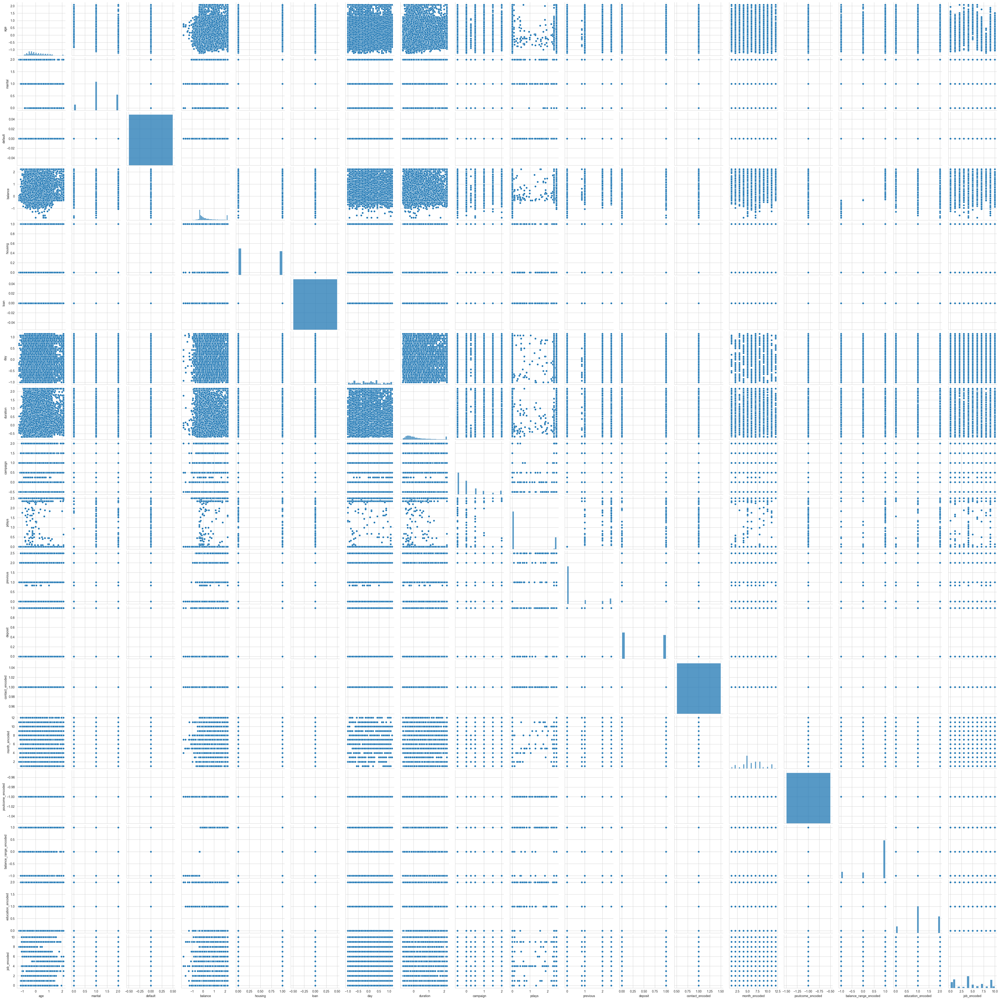

In [141]:
# check the data if it is linear or not
sns.pairplot(df)
plt.show()

from the previous pair plot the data is not linear

### check with PCA

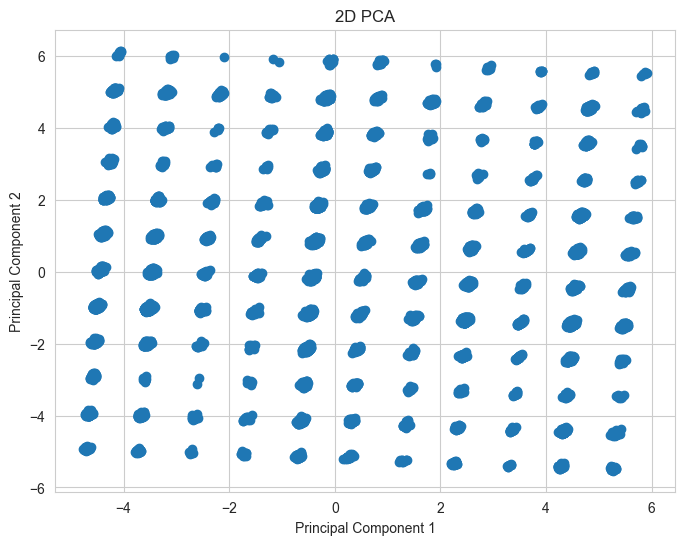

In [142]:
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(df)

# Creating a DataFrame for the PCA results
pca_df = pd.DataFrame(data=principalComponents, columns=['Principal Component 1', 'Principal Component 2'])

# Plotting
plt.figure(figsize=(8,6))
plt.scatter(pca_df['Principal Component 1'], pca_df['Principal Component 2'])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2D PCA')
plt.show()


### Use UMAP and T-SNE

#### T-SNE

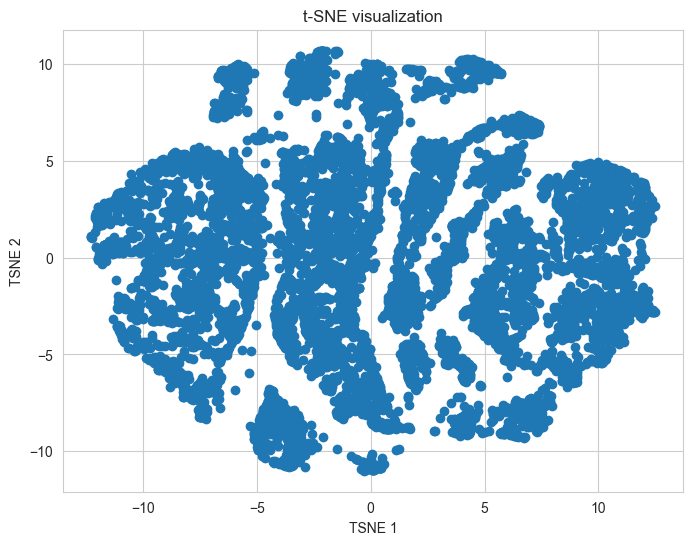

In [143]:
tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
tsne_results = tsne.fit_transform(df)

# Plotting
plt.figure(figsize=(8,6))
plt.scatter(tsne_results[:,0], tsne_results[:,1])
plt.xlabel('TSNE 1')
plt.ylabel('TSNE 2')
plt.title('t-SNE visualization')
plt.show()

#### UMAP

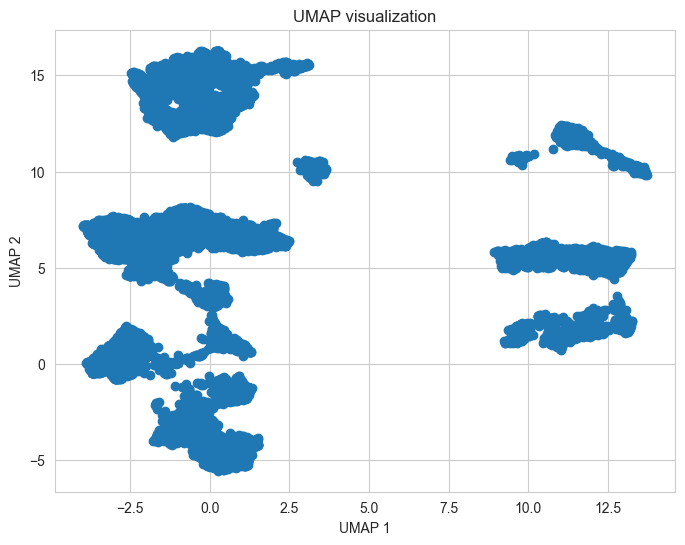

In [144]:
reducer = umap.UMAP()
umap = reducer.fit_transform(df)

# Plotting
plt.figure(figsize=(8,6))
plt.scatter(umap[:,0], umap[:,1])
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.title('UMAP visualization')
plt.show()

we should choose one of them based on :
* that make distinct cluster which have clear separations between groups
* less noise
* if you want to understand the overall relationship between clusters, UMAP might be preferable.
*  t-SNE, particularly, can produce somewhat different results each time it's run. It's essential to set a random state for reproducibility if needed.

based on the clusters from both of them UMAP is better

# Task 3: Analyze and Visualize insights.

In [145]:
#Bonus Plotly

In [146]:
fig = px.bar(df, x='poutcome_encoded', color='loan', title='Count Plot for poutcome with Hue of Loan',
             color_discrete_map={'yes': 'green', 'no': 'red'},
             labels={'poutcome': 'Outcome', 'loan': 'Loan Status'})

# Show the interactive plot
fig.show()

In [147]:
count_data = df.groupby(['poutcome_encoded', 'loan']).size().reset_index(name='count')
count_data

,poutcome_encoded,loan,count
0,-1.0,0.0,11156


In [148]:
# pivot_data = pd.pivot_table(count_data, values='count', index='poutcome', columns='loan', fill_value=0)

# # Calculate the percentage of 'loan=yes' for each 'poutcome' category
# pivot_data['percentage_loan_yes'] = (pivot_data['yes'] / (pivot_data['yes'] + pivot_data['no'])) * 100

# # Display the resulting DataFrame
# print(pivot_data)


KeyError: 'poutcome'

# Task 4: Build Clustering Models.

In [149]:
X = umap

## K-means

### choose the best K

#### 1.Elbow method

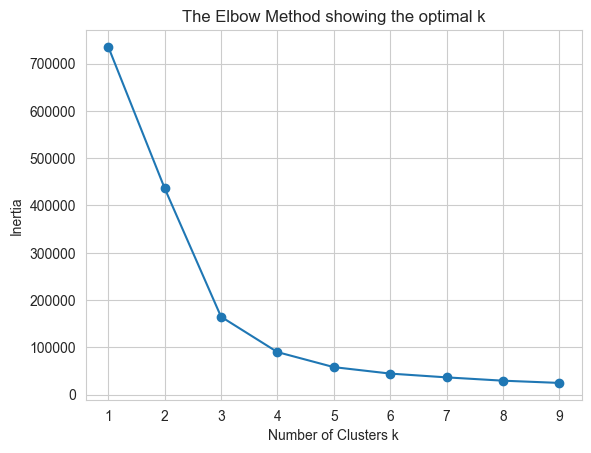

In [150]:
inertia = []
range_values = range(1, 10)

for i in range_values:
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

plt.plot(range_values, inertia, 'o-')
plt.xlabel('Number of Clusters k')
plt.ylabel('Inertia')
plt.title('The Elbow Method showing the optimal k')
plt.show()


#### 2. The Silhouette Score

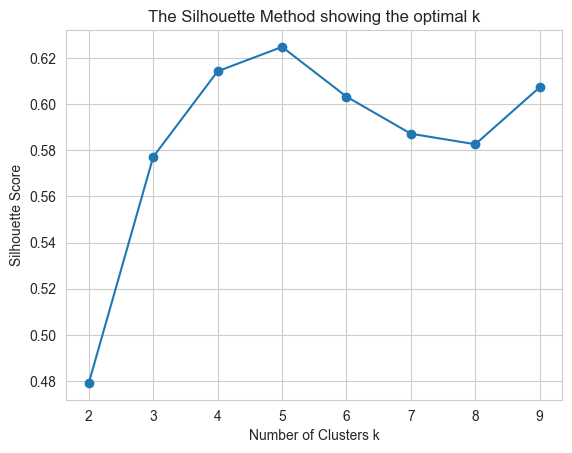

In [151]:
silhouette_scores = []

for i in range_values:  # Reusing range_values from the Elbow method
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X)
    if i == 1:
        continue  # Silhouette score cannot be calculated for one cluster
    score = silhouette_score(X, kmeans.labels_)
    silhouette_scores.append(score)

plt.plot(range_values[1:], silhouette_scores, 'o-')
plt.xlabel('Number of Clusters k')
plt.ylabel('Silhouette Score')
plt.title('The Silhouette Method showing the optimal k')
plt.show()


conclusion, k = 5 is the best

### call the model

In [152]:
k = 5
kmeans = KMeans(n_clusters=k, random_state=42)
clusters = kmeans.fit_predict(X)

### to visualize the clusters

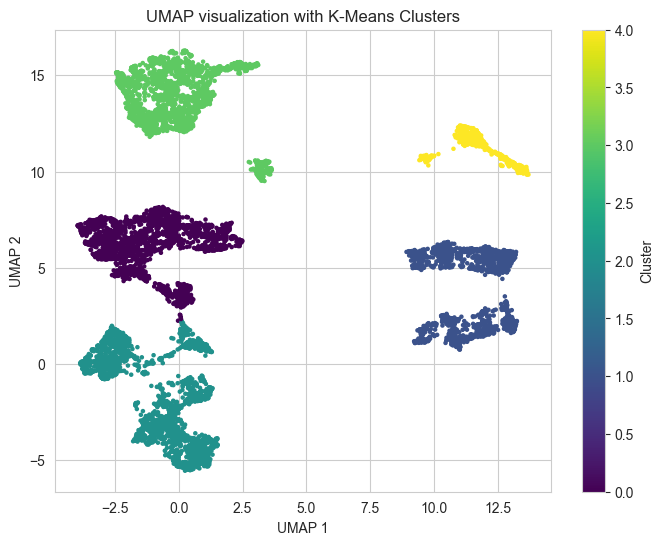

In [153]:
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=clusters, cmap='viridis', s=5)  # 's' adjusts the size of each point
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.title('UMAP visualization with K-Means Clusters')
plt.colorbar(label='Cluster')
plt.show()

## DB-Scan

### get the best eps and min_sample with Grid search

In [154]:
silhouette_scores = {}

# Grid search over different combinations of eps and min_samples
for eps in [0.1, 0.5, 1.0]:  # Adjust values as needed
    for min_samples in [3, 5, 10]:  # Adjust values as needed
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X)
        if len(np.unique(labels)) > 1:  # Silhouette score requires at least two clusters
            score = silhouette_score(X, labels)
            silhouette_scores[(eps, min_samples)] = score

# Find the combination with the highest silhouette score
best_eps, best_min_samples = max(silhouette_scores, key=silhouette_scores.get)
print(f'Best combination: eps={best_eps}, min_samples={best_min_samples}')


Best combination: eps=0.5, min_samples=3


### call the model

In [160]:
dbscan = DBSCAN(eps=0.5, min_samples=3)

dbscan.fit(X)

DBSCAN(min_samples=3)

### extract clusters label

In [161]:
# Get labels assigned to each data point
labels = dbscan.labels_

# Number of clusters in labels, ignoring noise if present
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print(f'Estimated number of clusters: {n_clusters_}')
print(f'Estimated number of noise points: {n_noise_}')


Estimated number of clusters: 8
Estimated number of noise points: 0


### visualize the clusters

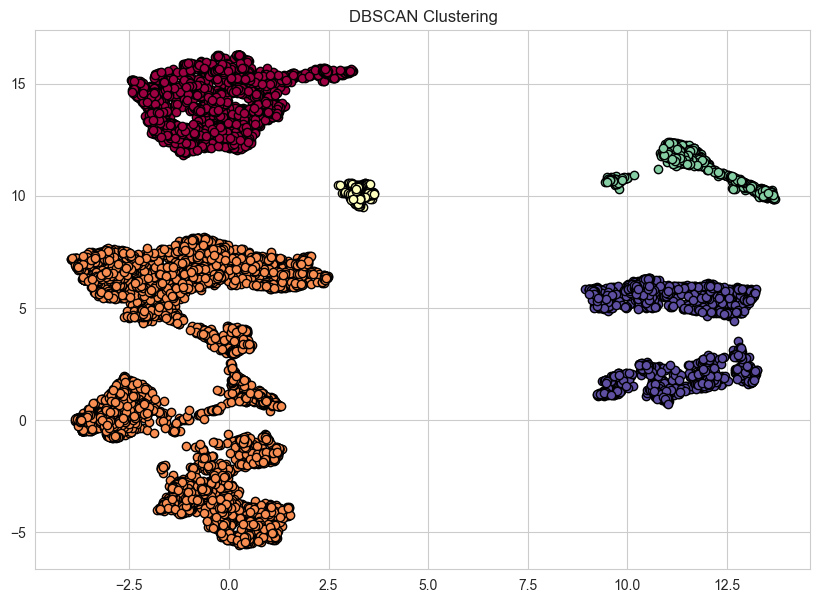

In [157]:
# Create a scatter plot
plt.figure(figsize=(10, 7))

# Plot points, coloring them based on their cluster label
# Note: '-1' labels are considered noise and colored differently
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=6)

plt.title('DBSCAN Clustering')
plt.show()


## Stacking Ensamble tecknique

In [158]:
class StackingEnsembleClustering(BaseEstimator, ClusterMixin):
    def __init__(self, base_estimators, meta_learner):
        self.base_estimators = base_estimators
        self.meta_learner = meta_learner

    def fit(self, X, y=None):
        # Generate cluster memberships from base clustering algorithms
        base_cluster_memberships = []
        for estimator in self.base_estimators:
            cluster_memberships = estimator.fit_predict(X)
            base_cluster_memberships.append(cluster_memberships)

        # Create meta-learner dataset
        meta_X = np.column_stack(base_cluster_memberships)

        # Train meta-learner
        self.meta_learner.fit(meta_X, y)

    def predict(self, X):
        # Generate cluster memberships from base clustering algorithms
        base_cluster_memberships = []
        for estimator in self.base_estimators:
            cluster_memberships = estimator.predict(X)
            base_cluster_memberships.append(cluster_memberships)

        # Create meta-learner dataset
        meta_X = np.column_stack(base_cluster_memberships)

        # Use meta-learner to combine predictions
        combined_cluster_memberships = self.meta_learner.predict(meta_X)
        return combined_cluster_memberships


In [166]:
# Initialize base clustering algorithms
dbscan = DBSCAN(eps=0.5, min_samples=5)
kmeans = KMeans(n_clusters=3)

# Initialize meta-learner
meta_learner = RandomForestClassifier(n_estimators=100)

# Split data into training and validation sets
X_train, X_valid = train_test_split(X, test_size=0.2, random_state=42)

# Fit base clustering algorithms on training data
dbscan_train = dbscan.fit_predict(X_train)
kmeans_train = kmeans.fit_predict(X_train)

# Calculate silhouette scores for the training data
silhouette_scores_train = silhouette_score(X_train, np.stack((dbscan_train, kmeans_train), axis=-1), metric='euclidean')

# Train meta-learner on training data using silhouette scores as target labels
meta_learner.fit(np.column_stack((dbscan_train, kmeans_train)), silhouette_scores_train)

# Generate cluster memberships for validation data
dbscan_valid = dbscan.predict(X_valid)
kmeans_valid = kmeans.predict(X_valid)

# Calculate silhouette scores for the validation data
silhouette_scores_valid = silhouette_score(X_valid, np.stack((dbscan_valid, kmeans_valid), axis=-1), metric='euclidean')

# Use silhouette scores as target labels for the validation data
predicted_silhouette_scores_valid = meta_learner.predict(np.column_stack((dbscan_valid, kmeans_valid)))

# Reshape predicted silhouette scores to 1D array
predicted_silhouette_scores_valid_1d = predicted_silhouette_scores_valid.ravel()

ValueError: y should be a 1d array, got an array of shape (8924, 2) instead.

In [ ]:
# Create a scatter plot of the data points with predicted clusters
plt.scatter(X_valid[:, 0], X_valid[:, 1], c=predicted_clusters_valid, cmap='viridis')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Predicted Clusters')
plt.colorbar(label='Cluster')
plt.show()

# Task 5: Analyzing Similarities and Differences Between Cluster Samples

## using tsne

### kmeans model

best k is 6, that makes more clusters

### db scan

best min smaples is 10 and this makes more clusters than k means and also there are alot of noises in the data

## using umap

### k means model

best k is 5

### db scan

best min samples is 3 and this makes moderate number of clusters and aloso there was not noise in the data